# Introduction

This is the analysis of gut intestinal stem cell data as presented in Böttcher et al. We use in total **76142** cells from **14 samples** in **6 conditions** (2 replicates in each mutant, 3 replicates in each control and 1 sample FVR only controls):

* Control (whole crypt)
* Control (FVR enriched)
* Control (FVR only)
* Mutant (Fltp deficient, whole crypt)
* Mutant (Fltp deficient, FVR enriched)
* Control (High fat diet project)

In this notebook, data are not batch effect corrected.

We filtered cells by

* number of reads
* number of detected genes
* fraction of mitochondrial reads (< 10%) 


## Tasks in this notebook

In order to keep the notebook structure short and well-arranged, we have split the gut intestinal stem cell analysis into several parts:

1. Pre-processing and filtering (thankfully done by Sophie)
2. Preparation of Batch effect correction
3. Data analysis with Graph abstraction (control only)
4. Subset analysis of EECs, PCs, Goblet cells and ISCs
5. Pseudotime analysis of ISC-PC-EEC-Goblet lineage
6. Differential gene expression analysis of mutants and control cells

This notebook covers **part 6**.

# Initialise scanpy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import matplotlib.colors as colors
import scanpy.api as sc
import matplotlib as mpl
import anndata
#import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import scipy as sci
import os

sc.settings.verbosity = 3                # amount of output
#sc.settings.set_dpi(60) # deprecated. low pixel number yields small inline figures
sc.logging.print_version_and_date()

Running Scanpy 1.3.1 on 2018-11-15 11:34.


In [2]:
import datetime

now = datetime.datetime.now()

In [3]:
today = now.strftime("%y%m%d")

## Load extensions

In [4]:
%run '~/Documents/Python/maren_codes/bar_frequency.py'
%run '~/Documents/Python/maren_codes/cal_density.py'
%run '~/Documents/Python/maren_codes/genes_to_xls.py'

Set custom color bar.

In [5]:
colors2 = pl.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = pl.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

## Custom dotplot

In [6]:
from scanpy import settings
from scanpy import logging as logg
from scanpy.plotting import *
#from scanpy..utils import sanitize_anndata
from pandas.api.types import is_categorical_dtype

def sanitize_anndata(adata):
    adata._sanitize()

def _prepare_dataframe(adata, var_names, groupby=None, use_raw=None, log=False, num_categories=7):
    """
    Given the anndata object, prepares a data frame in which the row index are the categories
    defined by group by and the columns correspond to var_names.
    Parameters
    ----------
    adata : :class:`~anndata.AnnData`
        Annotated data matrix.
    var_names : `str` or list of `str`
        `var_names` should be a valid subset of  `adata.var_names`.
    groupby : `str` or `None`, optional (default: `None`)
        The key of the observation grouping to consider. It is expected that
        groupby is a categorical. If groupby is not a categorical observation,
        it would be subdivided into `num_categories`.
    log : `bool`, optional (default: `False`)
        Use the log of the values
    use_raw : `bool`, optional (default: `None`)
        Use `raw` attribute of `adata` if present.
    num_categories : `int`, optional (default: `7`)
        Only used if groupby observation is not categorical. This value
        determines the number of groups into which the groupby observation
        should be subdivided.
    Returns
    -------
    Tuple of `pandas.DataFrame` and list of categories.
    """
    from scipy.sparse import issparse
    sanitize_anndata(adata)
    if use_raw is None and adata.raw is not None: use_raw = True
    if isinstance(var_names, str):
        var_names = [var_names]

    if groupby is not None:
        if groupby not in adata.obs_keys():
            raise ValueError('groupby has to be a valid observation. Given value: {}, '
                             'valid observations: {}'.format(groupby, adata.obs_keys()))

    if use_raw:
        matrix = adata.raw[:, var_names].X
    else:
        matrix = adata[:, var_names].X

    if issparse(matrix):
        matrix = matrix.toarray()
    if log:
        matrix = np.log1p(matrix)

    obs_tidy = pd.DataFrame(matrix, columns=var_names)
    if groupby is None:
        groupby = ''
        categorical = pd.Series(np.repeat('', len(obs_tidy))).astype('category')
    else:
        if not is_categorical_dtype(adata.obs[groupby]):
            # if the groupby column is not categorical, turn it into one
            # by subdividing into  `num_categories` categories
            categorical = pd.cut(adata.obs[groupby], num_categories)
        else:
            categorical = adata.obs[groupby]

    obs_tidy.set_index(categorical, groupby, inplace=True)
    categories = obs_tidy.index.categories

    return categories, obs_tidy

def pos_mean(group):
    return group[group>0].mean()

def dotplot(adata, var_names, groupby=None, use_raw=None, log=False, num_categories=7, max_scale=None, min_scale=None,
            color_map='Reds', figsize=None, var_group_positions=None, var_group_labels=None,
            var_group_rotation=None, show=None, save=None, **kwds):
    """\
    Makes a _dot plot_ of the expression values of `var_names`.
    For each var_name and each `groupby` category a dot is plotted. Each dot
    represents two values: mean expression within each category (visualized by
    color) and fraction of cells expressing the var_name in the
    category. (visualized by the size of the dot).  If groupby is not given, the
    dotplot assumes that all data belongs to a single category. A gene is not
    considered expressed if the expression value in the adata (or adata.raw) is
    equal to zero.
    For instance, for each marker gene, the mean value and the percentage of cells
    expressing the gene can be visualized for each cluster.
    Parameters
    ----------
    adata : :class:`~scanpy.api.AnnData`
        Annotated data matrix.
    var_names : `str` or list of `str`
        var_names should be a valid subset of  `.var_names`.
    groupby : `str` or `None`, optional (default: `None`)
        The key of the observation grouping to consider. It is expected that groupby is
        a categorical. If groupby is not a categorical observation, it would be
        subdivided into `num_categories`.
    log : `bool`, optional (default: `False`)
        Use the log of the values
    use_raw : `bool`, optional (default: `None`)
        Use `raw` attribute of `adata` if present.
    num_categories : `int`, optional (default: `7`)
        Only used if groupby observation is not categorical. This value determines
        the number of groups into which the groupby observation should be subdivided.
    max_scale : `float` (default: `None`) - enable global color scaling if not `None`
    min_scale : `float` (default: `None`) - enable global color scaling if not `None`
    color_map : `str`, optional (default: `Reds`)
        String denoting matplotlib color map.
    figsize : (float, float), optional (default: None)
        Figure size (width, height. If not set, the figure width is set based on the
        number of  `var_names` and the height is set to 10.
    var_group_positions :  list of `tuples`.
        Use this parameter to highlight groups of `var_names`. This will draw a 'bracket'
        on top of the plot between the given start and end positions. If the
        parameter `var_group_labels` is set, the corresponding labels is added on
        top of the bracket. E.g. var_group_positions = [(4,10)] will add a bracket
        between the fourth var_name and the tenth var_name. By giving more
        positions, more brackets are drawn.
    var_group_labels : list of `str`
        Labels for each of the var_group_positions that want to be highlighted.
    var_group_rotation : `float` (default: `None`)
        Label rotation degrees. By default, labels larger than 4 characters are rotated 90 degrees
    {show_save_ax}
    **kwds : keyword arguments
        Are passed to `matplotlib.pyplot.scatter`.
    Returns
    -------
    A list of `matplotlib.Axes` where the first ax is the groupby categories colorcode, the
    second axis is the heatmap and the third axis is the colorbar.
    """
    
    if use_raw is None and adata.raw is not None: use_raw = True
    categories, obs_tidy = _prepare_dataframe(adata, var_names, groupby, use_raw, log, num_categories)

    # for if category defined by groupby (if any) compute for each var_name
    # 1. the mean value over the category
    # 2. the fraction of cells in the category having a value > 0

    # 1. compute mean value
    mean_obs = obs_tidy.groupby(level=0).apply(pos_mean)

    # 2. compute fraction of cells having value >0
    # transform obs_tidy into boolean matrix
    obs_bool = obs_tidy.astype(bool)

    # compute the sum per group which in the boolean matrix this is the number
    # of values >0, and divide the result by the total number of values in the group
    # (given by `count()`)
    fraction_obs = obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()

    if figsize is None:
        height = len(categories) * 0.3 + 1  # +1 for labels
        # if the number of categories is small (eg 1 or 2) use
        # a larger height
        height = max([1.5, height])
        heatmap_width = len(var_names) * 0.5
        width = heatmap_width + 1.6 + 1  # +1.6 to account for the colorbar and  + 1 to account for labels
    else:
        width, height = figsize
        heatmap_width = width * 0.75

    # colorbar ax width should not change with differences in the width of the image
    # otherwise can become too small
    colorbar_width = 0.4
    colorbar_width_spacer = 0.7
    size_legend_width = 0.5

    if var_group_positions is not None and len(var_group_positions) > 0:
        # add some space in case 'brackets' want to be plotted on top of the image
        height_ratios = [0.5, 10]
    else:
        height_ratios = [0, 10.5]

    # define a layout of 2 rows x 4 columns
    # first row is for 'brackets' (if no brackets needed, the height of this row is zero)
    # second row is for main content. This second row
    # is divided into 4 axes:
    #   first ax is for the main figure
    #   second ax is for the color bar legend
    #   third ax is for an spacer that avoids the ticks
    #    from the color bar to be hidden beneath the size lengend axis
    #   fourth ax is to plot the size legend
    from matplotlib import gridspec
    fig = pl.figure(figsize=(width, height))
    axs = gridspec.GridSpec(nrows=2, ncols=4, left=0.05, right=0.48, wspace=0.05, hspace=0.04,
                            width_ratios=[heatmap_width, colorbar_width, colorbar_width_spacer, size_legend_width],
                            height_ratios=height_ratios)
    if len(categories) < 4:
        # when few categories are shown, the colorbar and size legend
        # need to be larger than the main plot, otherwise they would look
        # compressed. For this, the dotplot ax is split into two:
        axs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=axs[1, 0],
                                                height_ratios=[len(categories) * 0.3, 1])
        dot_ax = fig.add_subplot(axs2[0])
    else:
        dot_ax = fig.add_subplot(axs[1, 0])

    color_legend = fig.add_subplot(axs[1, 1])

    # to keep the size_legen of about the same height, irrespective
    # of the number of categories, the fourth ax is subdivided into two parts
    size_legend_height = min(1.3, height)
    # wspace is proportional to the width but a constant value is
    # needed such that the spacing is the same for thinner or wider images.
    wspace = 10.5 / width
    axs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=axs[1, 3], wspace=wspace,
                                            height_ratios=[size_legend_height / height,
                                                           (height - size_legend_height) / height])
    size_legend = fig.add_subplot(axs3[0])

    # make scatter plot in which
    # x = var_names
    # y = groupby category
    # size = fraction
    # color = mean expression

    y, x = np.indices(mean_obs.shape)
    y = y.flatten()
    x = x.flatten()
    frac = fraction_obs.values.flatten()
    mean_flat = mean_obs.values.flatten()
    cmap = pl.get_cmap(color_map)

    size = (frac * 10) ** 2

    import matplotlib.colors
    if max_scale is None:
        max_scale = max(mean_flat)
        
    if min_scale is None:
        min_scale = max(0,min(mean_flat))
    
    normalize = matplotlib.colors.Normalize(vmax=max_scale, vmin=min_scale)
    colors = [cmap(normalize(value)) for value in mean_flat]
    
    dot_ax.scatter(x, y, color=colors, s=size, cmap=cmap, norm=None, edgecolor='none', **kwds)
    y_ticks = range(mean_obs.shape[0])
    dot_ax.set_yticks(y_ticks)
    dot_ax.set_yticklabels([mean_obs.index[idx] for idx in y_ticks])

    x_ticks = range(mean_obs.shape[1])
    dot_ax.set_xticks(x_ticks)
    dot_ax.set_xticklabels([mean_obs.columns[idx] for idx in x_ticks], rotation=90)
    dot_ax.tick_params(axis='both', labelsize='small')
    dot_ax.grid(False)
    dot_ax.set_xlim(-0.5, len(var_names) + 0.5)
    dot_ax.set_ylabel(groupby)

    # to be consistent with the heatmap plot, is better to
    # invert the order of the y-axis, such that the first group is on
    # top
    ymin, ymax = dot_ax.get_ylim()
    dot_ax.set_ylim(ymax+0.5, ymin - 0.5)

    dot_ax.set_xlim(-1, len(var_names) + 0.5)

    # plot group legends on top of dot_ax (if given)
    if var_group_positions is not None and len(var_group_positions) > 0:
        gene_groups_ax = fig.add_subplot(axs[0, 0], sharex=dot_ax)
        _plot_gene_groups_brackets(gene_groups_ax, group_positions=var_group_positions,
                                   group_labels=var_group_labels,
                                   rotation=var_group_rotation)

    # plot colorbar
    import matplotlib.colorbar
    matplotlib.colorbar.ColorbarBase(color_legend, cmap=cmap, norm=normalize)

    # plot size bar
    fracs_legend = np.array([0.25, 0.50, 0.75, 1])
    size = (fracs_legend * 10) ** 2
    color = [cmap(normalize(value)) for value in np.repeat(max(mean_flat) * 0.7, len(size))]
    size_legend.scatter(np.repeat(0, len(size)), range(len(size)), s=size, color=color)
    size_legend.set_yticks(range(len(size)))
    size_legend.set_yticklabels(["{:.0%}".format(x) for x in fracs_legend])

    size_legend.tick_params(axis='y', left=False, labelleft=False, labelright=True)

    # remove x ticks and labels
    size_legend.tick_params(axis='x', bottom=False, labelbottom=False)

    # remove surrounding lines
    size_legend.spines['right'].set_visible(False)
    size_legend.spines['top'].set_visible(False)
    size_legend.spines['left'].set_visible(False)
    size_legend.spines['bottom'].set_visible(False)
    size_legend.grid(False)

    ymin, ymax = size_legend.get_ylim()
    size_legend.set_ylim(ymin, ymax+0.5)

    utils.savefig_or_show('dotplot', show=show, save=save)
    return axs

# Load data

Load the data set with all cells and all genes that is batch effect corrected with `ComBat` and the zero-fix.

In [6]:
adata = sc.read('./write/gut_AB_AL_log_cor_combat_normed.h5')

In [8]:
adata.obs_names_make_unique()

In [7]:
adata

AnnData object with n_obs × n_vars = 74491 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase'
    var: 'mean', 'dispersion'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [8]:
pd.value_counts(adata.obs['genetics'])

control    59964
mutant     14527
Name: genetics, dtype: int64

Load doublet score.

In [47]:
doublet_score = pd.read_csv('./write/doublet_score.csv', header=None, index_col=0)

In [48]:
adata.obs['doublet_score']=doublet_score[np.in1d(doublet_score.index, adata.obs_names)]

Load ISC-PC-EEC-GC-Tuft lineage object (i.e. all cells without lymphocytes).

In [10]:
alin = sc.read('./write/ISC_PC_EEC_GC_Tuft_ref.h5ad') 

In [11]:
alin

AnnData object with n_obs × n_vars = 58375 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'doublet_score', 'refined_clustering', 'major_cell_type', 'proma_cell_type', 'dpt_pseudotime', 'enrichment'
    var: 'mean', 'dispersion'
    uns: 'all_cluster_dgea', 'cell_type_colors', 'cell_type_sizes', 'diffmap_evals', 'iroot', 'louvain', 'louvain_colors', 'louvain_sizes', 'major_cell_type_colors', 'mean_pca_EE progenitor', 'mean_pca_EEC', 'mean_pca_Enterocyte', 'mean_pca_Enterocyte progenitor', 'mean_pca_Goblet cell', 'mean_pca_Goblet progenitor', 'mean_pca_ISC', 'mean_pca_Paneth cell', 'mean_pca_Paneth progenitor', 'mean_pca_Tuft cell', 'mean_pca_Tuft progenitor', 'neighbors', 'paga', 'pca', 'phase_colors', 'proma_cell_type_colors', 'proma_cell_type_sizes', 'rank_genes_groups', 'refined_clustering_colors', 'refined_clustering_sizes', 'sample_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne', '

In [54]:
tmp = a_nLy[:, 'Lgr5'].raw.X
print(tmp.mean())
print(pos_mean(tmp))
print(tmp[tmp>0].mean())
#pd.DataFrame(a_nLy[:,'Lgr5'].X).mean()

0.22633962
{'pos_mean': 1.1822858}
1.1822858


## Add cell-type info to full data set

In [12]:
alin.obs['refined_clustering'].cat.categories

Index(['ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor', 'Tuft 1', 'Tuft 2'],
      dtype='object')

In [13]:
alin.obs['major_cell_type'].cat.categories

Index(['ISC', 'Enterocyte', 'Goblet cell', 'Paneth cell', 'EEC', 'Tuft cell'], dtype='object')

In [14]:
adata.obs['cell_type'] = adata.obs['louvain']
adata.obs['cell_type'] = adata.obs['cell_type'].cat.add_categories([
    'EEC', 'Enterocyte', 'Goblet cell', 'ISC', 'Paneth cell', 'Tuft cell'])

In [15]:
adata.obs['cell_type'][alin.obs.index] = alin.obs['major_cell_type']
adata.obs['cell_type'] = adata.obs['cell_type'].cat.remove_unused_categories()

In [16]:
pd.value_counts(adata.obs['cell_type'])

Paneth cell    21132
Enterocyte     15446
ISC             9905
Goblet cell     7231
EEC             2897
4               2117
2               1921
1               1862
5               1815
Tuft cell       1764
3               1671
14              1135
7               1116
15              1097
8               1037
9               1000
11               530
12               332
13               310
16                84
17                57
0                 22
6                  7
10                 3
Name: cell_type, dtype: int64

In [56]:
alin.obs['refined_clustering'].cat.categories

Index(['ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor', 'Tuft 1', 'Tuft 2'],
      dtype='object')

In [57]:
adata.obs['cell_type_refined'] = adata.obs['louvain']
adata.obs['cell_type_refined'] = adata.obs['cell_type_refined'].cat.add_categories([
    'ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor',
       'Tuft 1', 'Tuft 2'])

In [58]:
adata.obs['cell_type_refined'][alin.obs.index] = alin.obs['refined_clustering']
adata.obs['cell_type_refined'] = adata.obs['cell_type_refined'].cat.remove_unused_categories()

In [59]:
pd.value_counts(adata.obs['cell_type_refined'])

Paneth 1                     18086
Enterocyte progenitor        10163
ISC                           7174
Enterocyte                    5283
Goblet 1                      4274
Paneth primed ISC             2731
4                             2117
2                             1921
1                             1862
5                             1815
3                             1671
Goblet progenitor             1593
Paneth 2                      1578
Paneth progenitor             1468
early Goblet                  1168
14                            1135
7                             1116
15                            1097
8                             1037
9                             1000
Tuft progenitor                702
Tuft 2                         646
11                             530
Tuft 1                         416
EC                             413
Ngn3 progenitor                386
SIK                            376
Sox4+ early EE progenitor      339
12                  

## Read reference genes from qPCR data

In previous qPCR data analyses, we used the following set of genes to study the ISC-EEC-Paneth cell lineage. It covers markers of EEC and Paneth cell lineage, stem cell markers, cell cycle markers etc. We aim to compare them with the single-cell RNAseq analysis, especially to check for the 'quiescent' EEC lineage with little expression in most qPCR marker genes.  
* Fltp - Flattop, 1700009p17Rik, Cfap126
* Hsp90 - Heat shock protein, substituted by Hsp90ab1

In [20]:
qPCR_genes = ['Lgr5', 'Olfm4', 'Ascl2', 'Prom1', 'Axin2', 'Fzd2', 'Fzd7', 'Lrp5', 'Lrp6', 'Notch1', 
              'Hes1', 'Smo', 'Yap1', 'Rnf43', 'Dvl2', 'Lrig1', 'mTert1', 'Bmi1', 'Hopx', 'Elf3', 
              'Sis', 'Fabp1', 'Atoh1', 'Dll1', 'Gfi1', 'Neurog3', 'Neurod1', 'Chga', 'Chgb', 'Isl1', 
              'Pax6', 'Foxa2', 'Nkx2-2', 'Sst', 'Gcg', 'Tph1', 'Sox9', 'Lyz1', 'Mmp7', 'Dll4', 
              'Muc2', 'Spdef', 'Foxa1', 'Dclk1', 'Fzd3', 'Fzd6', 'Ror2', 'Ptk7', 'Celsr1', 'Vangl1', 
              'Vangl2', 'Prickle1', 'Jun', 'Mki67', 'C-myc', 'Ccnd1', 'Ccnb1', 'Aurka', 'Cdk1', 'Cdk6',
              'Pcna', 'Cdkn1a', 'Cdkn1c', 'Cdkn2b', 'Ephb3', 'Ephb2', 'Efnb1', 'Cd24a', 'Cd44', 'Bmpr1a', 
              'Cfap126', 'Rn18S', 'Gapdh', 'Rpl37', 'Actb', 'Hsp90ab1', 'Uba52', 'Itgb1', 'Itga1', 'Itga2', 
              'Itga3', 'Itga5', 'Itga6', 'Itga9', 'Dnmt1', 'Dnmt3a', 'Tead1', 'Hmga2', 'Lfng', 'Igfbp7',
              'Syt13', '5330417C22Rik']

In [21]:
qPCR_ref_all = [x for x in qPCR_genes if x in adata.raw.var_names]

In [22]:
[x for x in qPCR_genes if x not in adata.raw.var_names]

['mTert1', 'C-myc', 'Rn18S']

For our interest, let us check the **Fltp** expression in the original data.

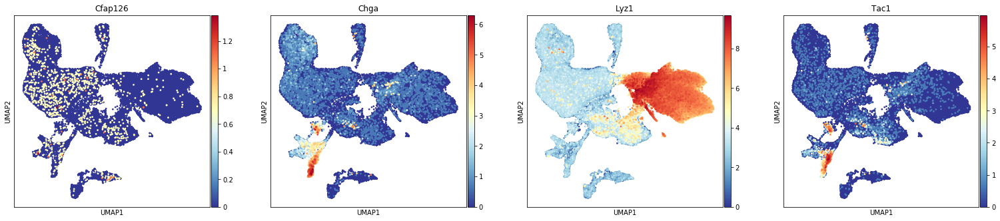

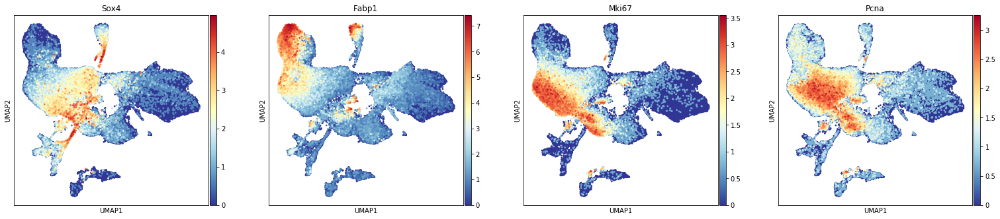

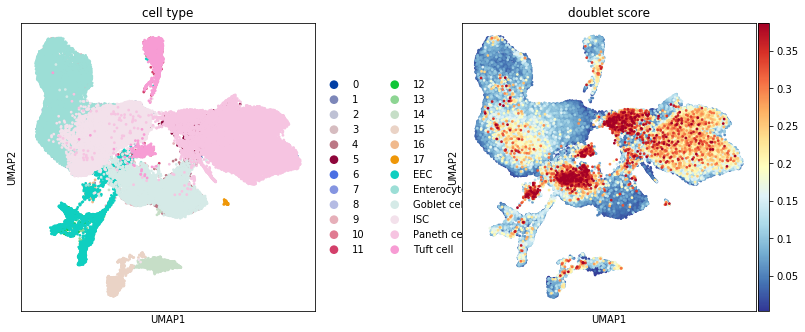

In [42]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata, color=['Cfap126', 'Chga', 'Lyz1', 'Tac1'], color_map='RdYlBu_r',size=30)
sc.pl.umap(adata, color=['Sox4', 'Fabp1', 'Mki67', 'Pcna'], color_map='RdYlBu_r',size=30)
sc.pl.umap(adata, color=['cell_type', 'doublet_score'], color_map='RdYlBu_r',size=30)

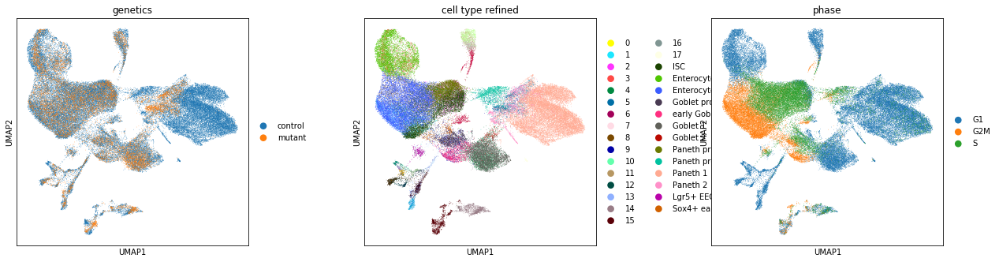

In [24]:
sc.pl.umap(adata, color=['genetics', 'cell_type_refined', 'phase'])

# Assign mutants to cell types 

## Compare to clustering before filtering

We have assigned most of the cells from control samples based on marker gene expression etc.
However, as we want to compare the mutant samples to the control samples as well, we have to assign correctly.

In [25]:
pd.crosstab(adata.obs['genetics'], adata.obs['louvain'])


louvain,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
genetics,,,,,,,,,,,,,,,,,,
control,8623,6658,6314,5485,4882,4183,4689,3505,3389,3027,3637,1764,1119,846,768,765,254,56
mutant,22,1862,1921,1671,2117,1815,7,1116,1037,1000,3,530,332,310,367,332,84,1


In [26]:
pd.crosstab(adata.obs['cell_type'], adata.obs['louvain'])


louvain,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
cell_type,,,,,,,,,,,,,,,,,,
0,22,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1862,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1921,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1671,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,2117,0,0,0,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1815,0,0,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1116,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1037,0,0,0,0,0,0,0,0,0


## Remove lymphocytes and outliers

In [43]:
a_nLy = adata[np.invert(np.in1d(adata.obs['cell_type'], ['14', '15','17', 'Lymphocyte']))]

In [44]:
pd.crosstab(a_nLy.obs['cell_type'], a_nLy.obs['louvain'])

louvain,0,1,2,3,4,5,6,7,8,9,10,11,12,13,16
cell_type,,,,,,,,,,,,,,,
0,22,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1862,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1921,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1671,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,2117,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1815,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1116,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1037,0,0,0,0,0,0


In [45]:
pd.crosstab(a_nLy.obs['cell_type_refined'], a_nLy.obs['louvain'])

louvain,0,1,2,3,4,5,6,7,8,9,10,11,12,13,16
cell_type_refined,,,,,,,,,,,,,,,
0,22,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,1862,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,1921,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,1671,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,2117,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,1815,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,1116,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,1037,0,0,0,0,0,0


In [46]:
sc.pp.neighbors(a_nLy, n_neighbors=30)
sc.tl.umap(a_nLy)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:51.35) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:01:30.38) --> added
    'X_umap', UMAP coordinates (adata.obsm)


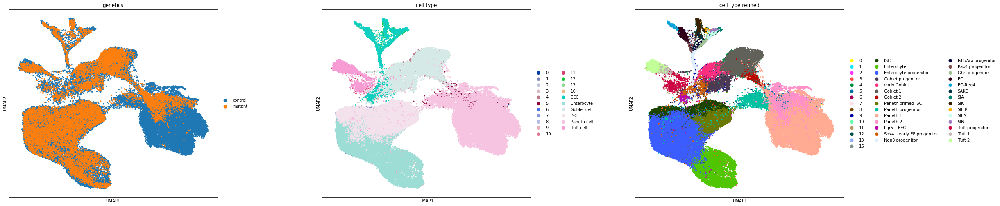

In [47]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_nLy, color=['genetics', 'cell_type', 'cell_type_refined'], size=40)


## Assign by majority vote

By looking at the crosstab results, we may assign all mutant (Louvain) clusters by the coarse-grained assignment we did in the first place.

In [32]:
a_nLy.obs['cell_type'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '16', '17', 'EEC', 'Enterocyte', 'Goblet cell', 'ISC',
       'Paneth cell', 'Tuft cell'],
      dtype='object')

In [73]:
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], ['Louvain 0', 'Louvain 7'])] = np.repeat(
    'TA', np.in1d(a_nLy.obs['cell_type'], ['Louvain 0', 'Louvain 7']).sum()) 
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], 'Louvain 4')] = np.repeat(
    'Paneth', np.in1d(a_nLy.obs['cell_type'], 'Louvain 4').sum()) 
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], ['Louvain 2', 'Louvain 9'])] = np.repeat(
    'Goblet', np.in1d(a_nLy.obs['cell_type'], ['Louvain 2', 'Louvain 9']).sum()) 
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], ['Louvain 5', 'Louvain 6', 'Louvain 16'])] = np.repeat(
    'ISC', np.in1d(a_nLy.obs['cell_type'], ['Louvain 5', 'Louvain 6', 'Louvain 16']).sum())
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], 'Louvain 10')] = np.repeat(
    'EEC', np.in1d(a_nLy.obs['cell_type'], 'Louvain 10').sum())
a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], 'Louvain 3')] = np.repeat(
    'Enterocyte', np.in1d(a_nLy.obs['cell_type'], 'Louvain 3').sum())

a_nLy.obs['cell_type'][np.in1d(a_nLy.obs['cell_type'], 'Louvain 12')] = np.repeat(
    'Tuft', np.in1d(a_nLy.obs['cell_type'], 'Louvain 12').sum())


a_nLy.obs['cell_type'] = a_nLy.obs['cell_type'].cat.remove_unused_categories() 

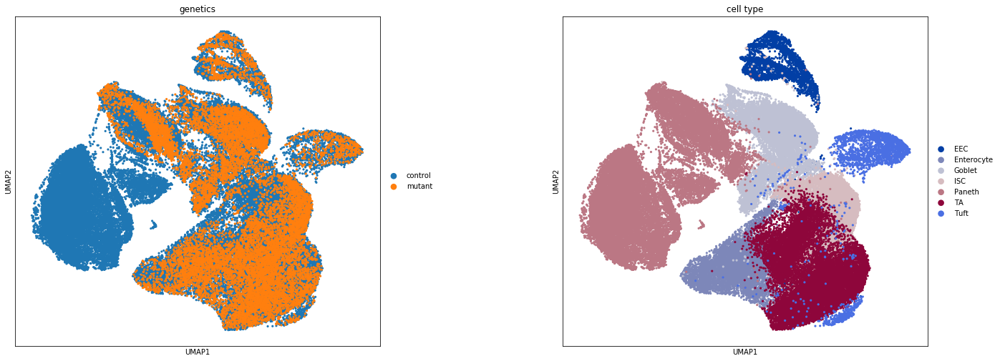

In [74]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_nLy, color=['genetics', 'cell_type'], size=40)

### Alternative: Assign by nearest neighbours

The approach presented above has several issues. First of all, we show that we have clustered both mutants and controls together, and repeated the clustering for controls only. Second, the clustering changes slightly when we included or excluded the mutants. When we use the majority vote approach for each cluster, the boundaries of ISCs, TAs and enterocytes are smeared out. 

The alternative approach is to use a k-nearest neighbour approach to assign each cell according to the assignment of its nearest neighbours. 

In [33]:
sc.pp.neighbors(a_nLy, n_neighbors=30)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:49.27) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


In [48]:
connections = a_nLy.uns['neighbors']['connectivities'].tocoo()

In [49]:
a_nLy.obs['cell_type_test']=a_nLy.obs['cell_type_refined']

In [50]:
mutant_idx = np.flatnonzero(np.in1d(a_nLy.obs['genetics'], 'mutant'))
for idx in mutant_idx:
    nn = connections.getrow(idx).nonzero()[1]
    nn_ctrl = nn[np.flatnonzero(np.in1d(a_nLy.obs['genetics'][nn], 'control'))]
    table = pd.value_counts(a_nLy.obs['cell_type_test'][nn_ctrl])
    if table.values[0]>0:
        a_nLy.obs['cell_type_test'][idx] = table.index[0]

In [51]:
a_nLy.obs['cell_type_test'] = a_nLy.obs['cell_type_test'].cat.remove_unused_categories()

In [52]:
pd.value_counts(a_nLy.obs['cell_type_test'])

Paneth 1                     18974
Enterocyte progenitor        13305
ISC                           9419
Enterocyte                    6873
Goblet 1                      6150
Paneth primed ISC             3394
Paneth 2                      2306
Goblet progenitor             2142
Paneth progenitor             1710
early Goblet                  1601
Tuft 2                         877
Tuft progenitor                870
EC                             591
Tuft 1                         544
SIK                            510
Ngn3 progenitor                475
Sox4+ early EE progenitor      405
EC-Reg4                        363
Lgr5+ EEC                      335
Goblet 2                       272
Ghrl progenitor                192
Pax4 progenitor                182
SAKD                           166
SILA                           163
SIA                            123
SIL-P                          111
Isl1/Arx progenitor             79
SIN                             68
5                   

In [53]:
pd.crosstab(a_nLy[a_nLy.obs['cell_type_test']=='Paneth 1'].obs['genetics'], 
            a_nLy[a_nLy.obs['cell_type_test']=='Paneth 1'].obs['phase'],margins=True, normalize=0)

phase,G1,G2M,S
genetics,,,
control,0.955712,0.000166,0.044123
mutant,0.935811,0.001126,0.063063
All,0.954780,0.000211,0.045009


In [54]:
a_nLy.obs['cell_type_test'][np.in1d(a_nLy.obs['cell_type_test'], ['5'])] = np.repeat(
    'Paneth progenitor', np.in1d(a_nLy.obs['cell_type_test'], ['5']).sum()) 
a_nLy.obs['cell_type_test'] = a_nLy.obs['cell_type_test'].cat.remove_unused_categories()


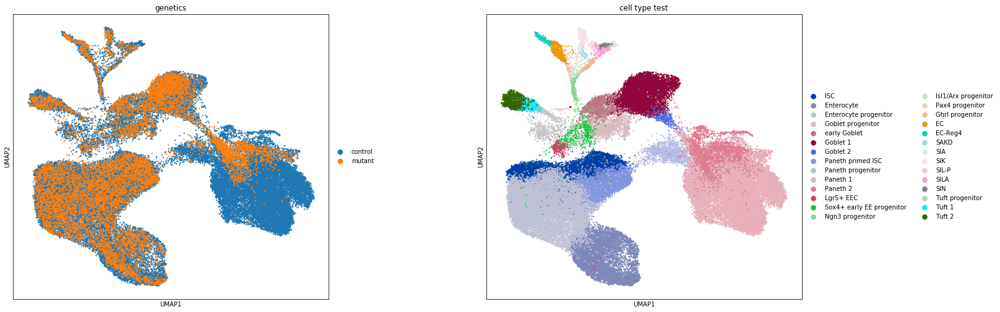

In [57]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_nLy, color=['genetics', 'cell_type_test'], size=20)

In [56]:
pd.crosstab(a_nLy.obs['cell_type_test'], adata.obs['cell_type_refined'])

cell_type_refined,0,1,2,3,4,5,6,7,8,9,...,EC-Reg4,SAKD,SIA,SIK,SIL-P,SILA,SIN,Tuft progenitor,Tuft 1,Tuft 2
cell_type_test,,,,,,,,,,,,,,,,,,,,,
ISC,0,615,1209,0,0,1,0,266,137,15,...,0,0,0,0,0,0,0,0,0,0
Enterocyte,0,0,0,1560,0,0,0,8,20,0,...,0,0,0,0,0,0,0,0,0,0
Enterocyte progenitor,0,1245,77,109,0,3,0,820,872,12,...,0,0,0,0,0,0,0,0,0,0
Goblet progenitor,0,2,0,0,44,1,0,0,0,498,...,0,0,0,0,0,0,0,0,0,0
early Goblet,0,0,0,0,116,0,0,0,0,317,...,0,0,0,0,0,0,0,0,0,0
Goblet 1,0,0,0,0,1864,1,0,0,0,11,...,0,0,0,0,0,0,0,0,0,0
Goblet 2,0,0,0,0,75,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Paneth primed ISC,0,0,633,0,0,0,0,21,8,1,...,0,0,0,0,0,0,0,0,0,0
Paneth progenitor,0,0,0,1,2,240,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In total, it seems that the nearest neighbour approach does not work better than using the original clustering. 

In [63]:
sc.write(adata=a_nLy, filename='./write/gut_AB_AL_annotated_mutants.h5ad')

## Create correlation heatmap

In order to ensure that our majority vote mapping resolves the correct cell types in control and mutant (*i.e.* the corresponding cell types are highly correlated), we display the correlation of the highly variable genes. 

In [7]:
a_nLy = sc.read('./write/gut_AB_AL_annotated_mutants.h5ad')

In [58]:
a_nLy.obs['cell_type_test'].cat.categories

Index(['ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor', 'Tuft 1', 'Tuft 2'],
      dtype='object')

In [59]:
a_nLy.obs['proma_cell_type'] = a_nLy.obs['cell_type_test'].cat.add_categories([
     "Paneth cell" , "EE progenitor"   ,"EEC" ,
    'Goblet cell',  'Tuft cell'])
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['ISC', 'Paneth primed ISC'])] = np.repeat(
    'ISC', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['ISC', 'Paneth primed ISC']).sum())
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['Paneth 1', 'Paneth 2'])] = np.repeat(
    'Paneth cell', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['Paneth 1', 'Paneth 2']).sum())
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor'])] = np.repeat(
    'EE progenitor', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor']).sum())
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN'])] = np.repeat(
    'EEC', np.in1d(a_nLy.obs['cell_type_test'], 
                                         [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN']).sum())

a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['Goblet 1', 'Goblet 2'])] = np.repeat(
    'Goblet cell', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['Goblet 1', 'Goblet 2']).sum())
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['Goblet progenitor', 'early Goblet'])] = np.repeat(
    'Goblet progenitor', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['Goblet progenitor', 'early Goblet']).sum())
a_nLy.obs['proma_cell_type'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['Tuft 1', 'Tuft 2'])] = np.repeat(
    'Tuft cell', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['Tuft 1', 'Tuft 2']).sum())
a_nLy.obs['proma_cell_type'] = a_nLy.obs['proma_cell_type'].cat.remove_unused_categories()

In [8]:
a_nLy.obs['proma_split_Gpc'] = a_nLy.obs['proma_cell_type'].cat.add_categories([
    
    'early Goblet'])
a_nLy.obs['proma_split_Gpc'][np.in1d(a_nLy.obs['cell_type_test'], 
                                    ['early Goblet'])] = np.repeat(
    'early Goblet', np.in1d(a_nLy.obs['cell_type_test'], 
                                         ['early Goblet']).sum())
a_nLy.obs['proma_split_Gpc'] = a_nLy.obs['proma_split_Gpc'].cat.remove_unused_categories()

In [14]:
a_nLy.obs['proma_split_Gpc']=a_nLy.obs['proma_split_Gpc'].cat.reorder_categories([
    'ISC', 'Enterocyte progenitor','Enterocyte',  
    'Goblet progenitor', 'early Goblet', 'Goblet cell',
       'Paneth progenitor',  'Paneth cell', 'EE progenitor',
       'EEC','Tuft progenitor', 'Tuft cell'])

In [15]:
a_nLy.obs['proma_split_Gpc'].cat.categories

Index(['ISC', 'Enterocyte progenitor', 'Enterocyte', 'Goblet progenitor',
       'early Goblet', 'Goblet cell', 'Paneth progenitor', 'Paneth cell',
       'EE progenitor', 'EEC', 'Tuft progenitor', 'Tuft cell'],
      dtype='object')

In [31]:
annot_key='proma_split_Gpc'

for genetic in a_nLy.obs['genetics'].cat.categories:
    print(genetic)
    for group in a_nLy.obs[annot_key].cat.categories:
        print(group)
        ix=np.logical_and(np.in1d(a_nLy.obs[annot_key],group), np.isin(a_nLy.obs['genetics'],genetic))
        alin_sub=a_nLy.copy()[ix]
        a_nLy.uns['mean_pca_'+group+'_'+genetic]=np.squeeze(np.asarray(alin_sub.obsm['X_pca'].mean(axis=0).T))
        del alin_sub

control
ISC
Enterocyte
Enterocyte progenitor
Goblet progenitor
Paneth progenitor
Tuft progenitor
Paneth cell
EE progenitor
EEC
Goblet cell
Tuft cell
early Goblet
mutant
ISC
Enterocyte
Enterocyte progenitor
Goblet progenitor
Paneth progenitor
Tuft progenitor
Paneth cell
EE progenitor
EEC
Goblet cell
Tuft cell
early Goblet


In [32]:
a_nLy

AnnData object with n_obs × n_vars = 72202 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_refined', 'doublet_score', 'cell_type_test', 'proma_cell_type', 'proma_split_Gpc'
    var: 'mean', 'dispersion'
    uns: 'cell_type_colors', 'cell_type_refined_colors', 'cell_type_test_colors', 'genetics_colors', 'louvain', 'louvain_colors', 'mean_pca_EE progenitor_control', 'mean_pca_EE progenitor_mutant', 'mean_pca_EEC_control', 'mean_pca_EEC_mutant', 'mean_pca_Enterocyte progenitor_control', 'mean_pca_Enterocyte progenitor_mutant', 'mean_pca_Enterocyte_control', 'mean_pca_Enterocyte_mutant', 'mean_pca_Goblet cell_control', 'mean_pca_Goblet cell_mutant', 'mean_pca_Goblet progenitor_control', 'mean_pca_Goblet progenitor_mutant', 'mean_pca_ISC_control', 'mean_pca_ISC_mutant', 'mean_pca_Paneth cell_control', 'mean_pca_Paneth cell_mutant', 'mean_pca_Paneth progenitor_control', 'mean_pca

In [37]:
#### create a dataframe  #######

d = {'Ctrl_ISC':a_nLy.uns['mean_pca_ISC_control'],
     'Ctrl_Enterocyte progenitor':a_nLy.uns['mean_pca_Enterocyte progenitor_control'],
     'Ctrl_Enterocyte':a_nLy.uns['mean_pca_Enterocyte_control'],
     'Ctrl_Goblet progenitor':a_nLy.uns['mean_pca_Goblet progenitor_control'],
     'Ctrl_early Goblet':a_nLy.uns['mean_pca_early Goblet_control'],
     'Ctrl_Goblet cell':a_nLy.uns['mean_pca_Goblet cell_control'],
     'Ctrl_EE progenitor':a_nLy.uns['mean_pca_EE progenitor_control'],
     'Ctrl_EEC':a_nLy.uns['mean_pca_EEC_control'],
     'Ctrl_Tuft progenitor':a_nLy.uns['mean_pca_Tuft progenitor_control'],
     'Ctrl_Tuft cell':a_nLy.uns['mean_pca_Tuft cell_control'],
     'Ctrl_Paneth progenitor':a_nLy.uns['mean_pca_Paneth progenitor_control'],
     'Ctrl_Paneth cell':a_nLy.uns['mean_pca_Paneth cell_control'],
     'Mut_ISC':a_nLy.uns['mean_pca_ISC_mutant'],
     'Mut_Enterocyte progenitor':a_nLy.uns['mean_pca_Enterocyte progenitor_mutant'],
     'Mut_Enterocyte':a_nLy.uns['mean_pca_Enterocyte_mutant'],
     'Mut_Goblet progenitor':a_nLy.uns['mean_pca_Goblet progenitor_mutant'],
     'Mut_early Goblet':a_nLy.uns['mean_pca_early Goblet_mutant'],
     'Mut_Goblet cell':a_nLy.uns['mean_pca_Goblet cell_mutant'],
     'Mut_EE progenitor':a_nLy.uns['mean_pca_EE progenitor_mutant'],
     'Mut_EEC':a_nLy.uns['mean_pca_EEC_mutant'],
     'Mut_Tuft progenitor':a_nLy.uns['mean_pca_Tuft progenitor_mutant'],
     'Mut_Tuft cell':a_nLy.uns['mean_pca_Tuft cell_mutant'],
     'Mut_Paneth progenitor':a_nLy.uns['mean_pca_Paneth progenitor_mutant'],
     'Mut_Paneth cell':a_nLy.uns['mean_pca_Paneth cell_mutant']
     }

df = pd.DataFrame(data=d)


##### sort data frame  ######

names_sort_group=['Ctrl_ISC',
                  'Mut_ISC',
                  'Ctrl_Enterocyte progenitor', 
                  'Mut_Enterocyte progenitor',
                  'Ctrl_Enterocyte','Mut_Enterocyte', 
                  'Ctrl_Goblet progenitor', 
                  'Mut_Goblet progenitor', 
                  'Ctrl_early Goblet','Mut_early Goblet',
                  'Ctrl_Goblet cell','Mut_Goblet cell',
                  'Ctrl_EE progenitor',  
                  'Mut_EE progenitor',
                   'Ctrl_EEC','Mut_EEC',   
                  'Ctrl_Paneth progenitor','Mut_Paneth progenitor',
                   'Ctrl_Paneth cell','Mut_Paneth cell', 
                  'Ctrl_Tuft progenitor','Mut_Tuft progenitor',                
                  'Ctrl_Tuft cell','Mut_Tuft cell',
                 # 'CD_not annotated','HFD_not annotated'
                 ]
df_sort=df[names_sort_group]

In [10]:
del a_nLy

In [34]:
del d
del df
del df_sort

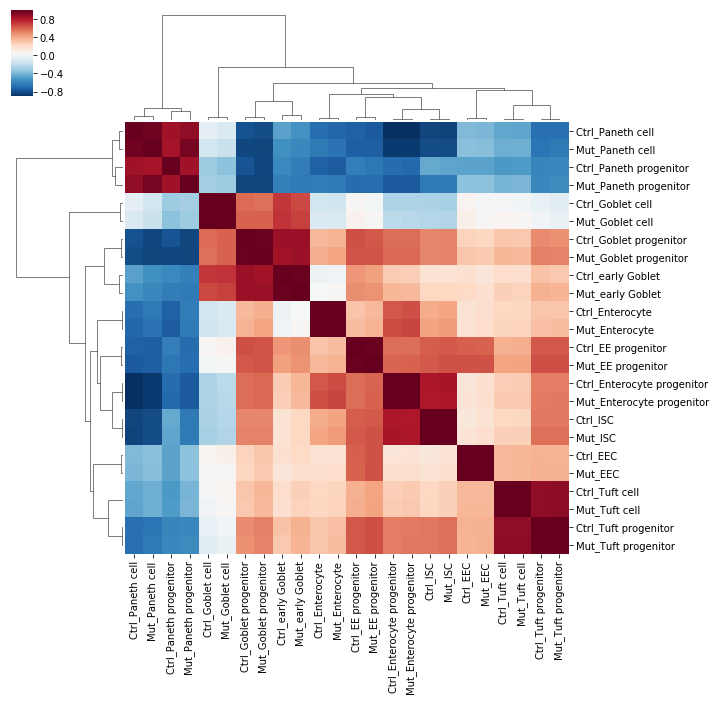

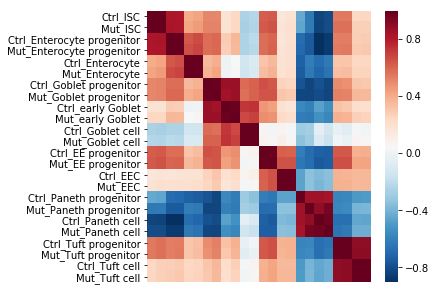

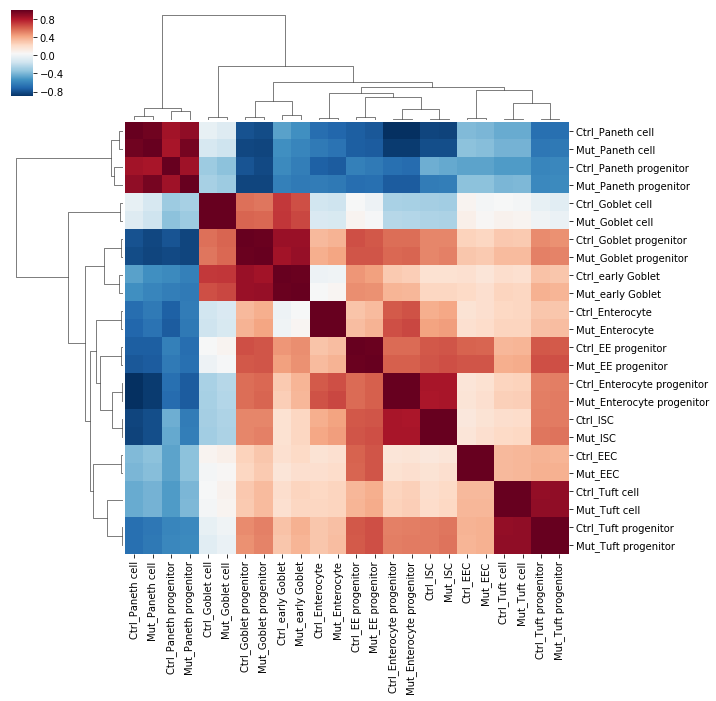

In [38]:
###### calculate correlation  #########

df_cor_pearson=np.corrcoef(df_sort.T)
names=df_sort.columns
df_cor_named_pearson=pd.DataFrame(df_cor_pearson,index=names,columns=names)


##### clustermap  ######
rcParams['figure.figsize']=(5,5)
ax=sns.clustermap(df_cor_named_pearson,cmap='RdBu_r',method='average')
pl.savefig('./figures/'+today+'_correlation_progen_mutant_control_clustered.pdf', 
           dpi=300, orientation='landscape',bbox_inches='tight')

pl.show()


##### heatmap without clustering (groups sorted as defined above) ########

ax=sns.heatmap(df_cor_named_pearson,cmap='RdBu_r',yticklabels=True,xticklabels=False)
pl.savefig('./figures/'+today+'_correlation_progen_mutant_control.pdf', 
           dpi=300, orientation='landscape',bbox_inches='tight')
pl.show()


###### other correlation measures ######

import sklearn.metrics.pairwise
df_cor_cosine=sklearn.metrics.pairwise.cosine_distances(df_sort.T)
names=df_sort.columns
df_cor_named_cosine=pd.DataFrame(1-df_cor_cosine,index=names,columns=names)

ax=sns.clustermap(df_cor_named_cosine,cmap='RdBu_r', method='average')
pl.show()

# Check gene scores

In [16]:
sc.write(adata=a_nLy, filename='.write/gut_AB_AL_annotated_mutants.h5ad')

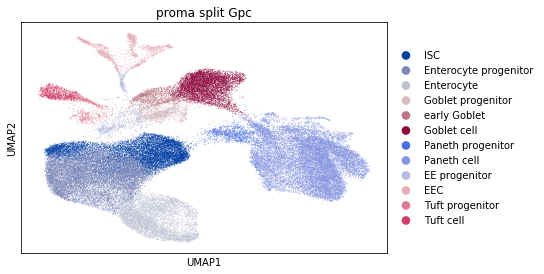

In [17]:
sc.pl.umap(a_nLy, 'proma_split_Gpc')

In [19]:
a_nLy.uns['proma_split_Gpc_colors'][0] = '#A30059' #ISC 
a_nLy.uns['proma_split_Gpc_colors'][1] = '#FF4A46' #Enterocyte progenitor
a_nLy.uns['proma_split_Gpc_colors'][2] = '#5A0007' #Enterocyte 
a_nLy.uns['proma_split_Gpc_colors'][3] = '#006FA6' #Goblet progenitor
a_nLy.uns['proma_split_Gpc_colors'][4] = '#CB63CC' #early Goblet
a_nLy.uns['proma_split_Gpc_colors'][5] = '#0000A6' #Goblet
a_nLy.uns['proma_split_Gpc_colors'][6] = '#fdb462' #Paneth progenitor
a_nLy.uns['proma_split_Gpc_colors'][7] = '#ffd92f' #Paneth
a_nLy.uns['proma_split_Gpc_colors'][8] = '#63FFAC' #EEprogenitor
a_nLy.uns['proma_split_Gpc_colors'][9] = '#0A8201' #EEC
a_nLy.uns['proma_split_Gpc_colors'][10] = '#9083CF' #Tuft progenitor
a_nLy.uns['proma_split_Gpc_colors'][11] = '#304130' #Tuft

In [23]:
sc.write('./write/gut_AB_AL_annotated_mutants.h5ad',a_nLy)

saving figure to file ./figures/umap181107_mutant_progen_split_Gpc.pdf


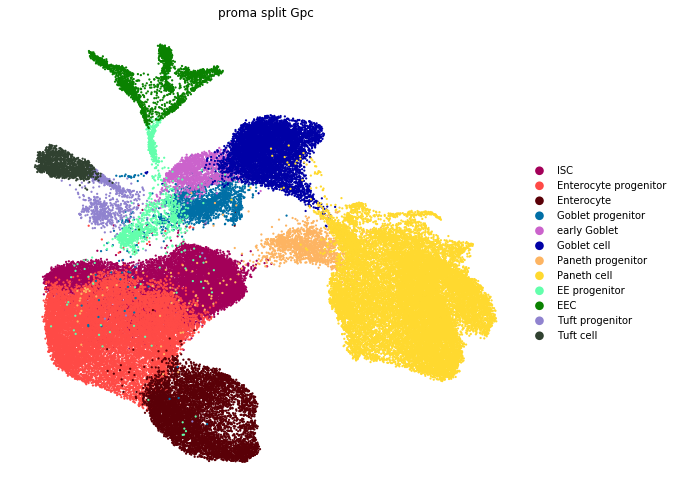

saving figure to file ./figures/umap181107_mutant_control.pdf


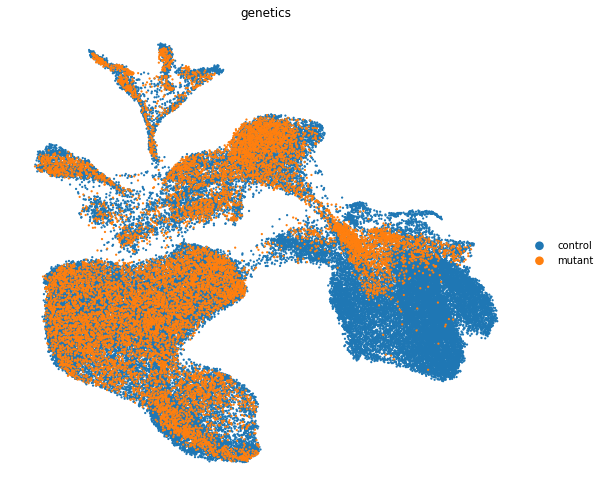

In [63]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(a_nLy, 'proma_split_Gpc',size=20, frameon=False,
           save=today + '_mutant_progen_split_Gpc.pdf')
sc.pl.umap(a_nLy, 'genetics',size=20,frameon=False, 
           save=today + '_mutant_control.pdf')

In [25]:
sc.tl.umap(a_nLy, n_components=3)

computing UMAP
    finished (0:01:42.41) --> added
    'X_umap', UMAP coordinates (adata.obsm)


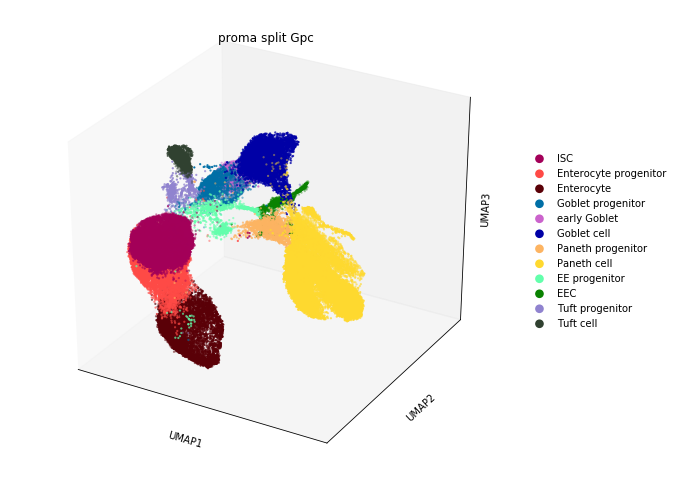

In [29]:
sc.pl.umap(a_nLy, color='proma_split_Gpc', projection='3d', size=20)

In [30]:
a_nLy = sc.read('./write/gut_AB_AL_annotated_mutants.h5ad')

We have already computed the proliferation score ('cell cycle' score) for the complete data set.

In [37]:
canonical_wnt_genes = [ 'Axin2', 'Ascl2', 'Lgr5', 'Myc', 'Hopx']
more_interesting_genes =['Atoh1', "Spdef","Lbh", 'Klf15', "Ier2", 'Klf3',  "Btg2", "Sox4" ] #, 'Cdkn1a', "Insm1", "Neurog3"


In [38]:
receptors = [
    'Fgfr1','Fgfr2','Fgfr3','Fgfr4', #FGF
    'Egfr', 'Erbb2','Erbb3','Lrig1', #EGF 
    'Bmpr1a', 'Bmpr2','Id1','Id2','Id3', #BMP
    'Notch1','Notch2','Notch3','Jag1','Dll1','Dll4','Hes1','Lfng', #Notch 
    'Sfrp5','Sfrp1','Fzd1','Fzd2','Fzd3','Fzd6','Fzd7','Fzd8','Lrp5','Lrp6', #Wnt 
    'Smo', 'Shh', 'Ihh', #Hedgehog
    'Yap1','Tead2', 'Tead3', #Hippo
    'Fzd3', 'Fzd6', 'Ror2', 'Ptk7', 'Celsr1', 'Vangl1', 'Vangl2', 'Prickle1', 'Jun', #Wnt/PCP
    'Ephb2', 'Ephb3', 'Efnb1', #Ephrin signalling
    'Itgb1', 'Itga1','Itga2', 'Itga3', 'Itga5', 'Itga6', 'Itga9' #integrin signalling
    
    
]

In [66]:
for cgene in canonical_wnt_genes:
    sc.pl.umap(a_nLy[a_nLy.obs['genetics']=='mutant'],
               save=today +cgene + '_canonical_wnt_mutant.pdf',
           color=cgene, color_map=mymap, size=30, show=False)
    sc.pl.umap(a_nLy[a_nLy.obs['genetics']=='control'],
               save=today + cgene+'_canonical_wnt_control.pdf',
           color=cgene, color_map=mymap, size=30, show=False)

saving figure to file ./figures/umap180927Axin2_canonical_wnt_mutant.pdf
saving figure to file ./figures/umap180927Axin2_canonical_wnt_control.pdf
saving figure to file ./figures/umap180927Ascl2_canonical_wnt_mutant.pdf
saving figure to file ./figures/umap180927Ascl2_canonical_wnt_control.pdf
saving figure to file ./figures/umap180927Lgr5_canonical_wnt_mutant.pdf
saving figure to file ./figures/umap180927Lgr5_canonical_wnt_control.pdf
saving figure to file ./figures/umap180927Myc_canonical_wnt_mutant.pdf
saving figure to file ./figures/umap180927Myc_canonical_wnt_control.pdf
saving figure to file ./figures/umap180927Hopx_canonical_wnt_mutant.pdf
saving figure to file ./figures/umap180927Hopx_canonical_wnt_control.pdf


Create violin plots for the cell-type wise comparison of mutants and controls.

In [14]:
a_nLy.obs['sample'].cat.categories

Index(['CD_1', 'CD_2', 'CD_3', 'Control_1', 'Control_2', 'Control_3_FVR',
       'Control_4_FVR', 'Control_5_FVR', 'Control_6', 'Control_7_FVR_only',
       'Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'],
      dtype='object')

In [15]:
a_nLy.obs['cell_type_test'].cat.categories

Index(['ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor', 'Tuft 1', 'Tuft 2'],
      dtype='object')

In [11]:
adat_sub = a_nLy[np.in1d(a_nLy.obs['cell_type_test'],['ISC', 'Paneth primed ISC', 'Paneth progenitor',
                                                      'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
                                                       'Sox4+ early EE progenitor', 'Ngn3 progenitor',
                                                      'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN'
                                                     ] )]
#adat_sub = adat_sub[np.in1d(adat_sub.obs['sample'], ['Control_1', 'Control_2', 'Control_3_FVR',
#       'Control_4_FVR','Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'])]

In [12]:
adat_sub.obs['proma_cell_type'] = adat_sub.obs['cell_type_test'].cat.add_categories([ 
     "Paneth cell" , "EE progenitor"   ,"EEC"  ])
adat_sub.obs['proma_cell_type'][np.in1d(adat_sub.obs['cell_type_test'], 
                                    ['ISC', 'Paneth primed ISC'])] = np.repeat(
    'ISC', np.in1d(adat_sub.obs['cell_type_test'], 
                                         ['ISC', 'Paneth primed ISC']).sum())
adat_sub.obs['proma_cell_type'][np.in1d(adat_sub.obs['cell_type_test'], 
                                    ['Paneth 1', 'Paneth 2'])] = np.repeat(
    'Paneth cell', np.in1d(adat_sub.obs['cell_type_test'], 
                                         ['Paneth 1', 'Paneth 2']).sum())
adat_sub.obs['proma_cell_type'][np.in1d(adat_sub.obs['cell_type_test'], 
                                    ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor'])] = np.repeat(
    'EE progenitor', np.in1d(adat_sub.obs['cell_type_test'], 
                                         ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor']).sum())
adat_sub.obs['proma_cell_type'][np.in1d(adat_sub.obs['cell_type_test'], 
                                    [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN'])] = np.repeat(
    'EEC', np.in1d(adat_sub.obs['cell_type_test'], 
                                         [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN']).sum())
adat_sub.obs['proma_cell_type'] = adat_sub.obs['proma_cell_type'].cat.remove_unused_categories()

In [13]:
adat_sub.obs['proma_cell_type'].cat.categories

Index(['ISC', 'Paneth progenitor', 'Paneth cell', 'EE progenitor', 'EEC'], dtype='object')

In [14]:
adat_sub.obs['proma_cell_type'].value_counts()

Paneth cell          21280
ISC                  12813
EEC                   2548
Paneth progenitor     1712
EE progenitor         1215
Name: proma_cell_type, dtype: int64

In [15]:
pd.crosstab(adat_sub.obs['proma_cell_type'], adat_sub.obs['genetics'])

genetics,control,mutant
proma_cell_type,,
ISC,9905,2908
Paneth progenitor,1468,244
Paneth cell,19664,1616
EE progenitor,980,235
EEC,1917,631


In [23]:
a_nLy.obs['sample'].cat.categories

Index(['CD_1', 'CD_2', 'CD_3', 'Control_1', 'Control_2', 'Control_3_FVR',
       'Control_4_FVR', 'Control_5_FVR', 'Control_6', 'Control_7_FVR_only',
       'Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'],
      dtype='object')

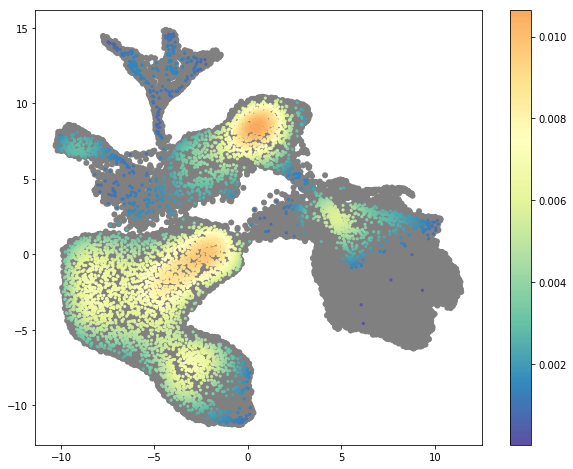

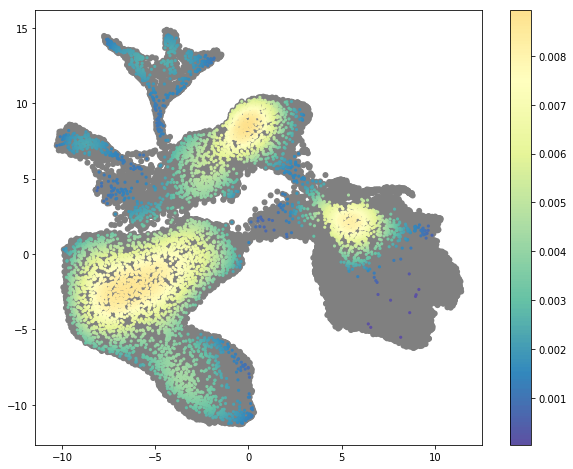

()

In [26]:
rcParams['figure.figsize']=(10,8)
enrich = 'mutant_noEnrich'
control_samples = np.in1d(a_nLy.obs['sample'], ['Mutant_1', 'Mutant_2'])
adata_control = a_nLy[control_samples,:]
adata_control.obsm['X_umap'] = a_nLy.obsm['X_umap'][control_samples,:]
adata_control= cal_density(adata_control, mapping='X_umap')
plot_density(adata_control,a_nLy, mapping='X_umap', max_scale=0.015, 
             save=today+'_density_' + enrich + '.pdf')

enrich = 'mutant_FVR'
control_samples = np.in1d(a_nLy.obs['sample'], ['Mutant_3_FVR', 'Mutant_4_FVR'])
adata_control = a_nLy[control_samples,:]
adata_control.obsm['X_umap'] = a_nLy.obsm['X_umap'][control_samples,:]
adata_control= cal_density(adata_control, mapping='X_umap')
plot_density(adata_control,a_nLy, mapping='X_umap', max_scale=0.015, 
             save=today+'_density_' + enrich + '.pdf')

In [19]:
a_nLy.obs['sample'].cat.categories

Index(['CD_1', 'CD_2', 'CD_3', 'Control_1', 'Control_2', 'Control_3_FVR',
       'Control_4_FVR', 'Control_5_FVR', 'Control_6', 'Control_7_FVR_only',
       'Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'],
      dtype='object')

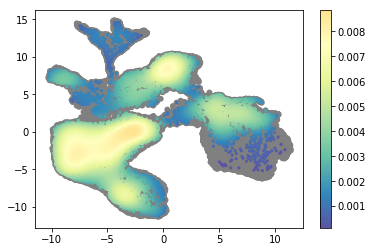

()

In [22]:
enrich = 'control'
control_samples = np.in1d(a_nLy.obs['sample'], 
                            ['Control_1', 'Control_2', 
                             'Control_3_FVR', 'Control_4_FVR'])
adata_control = a_nLy[control_samples,:]
adata_control.obsm['X_umap'] = a_nLy.obsm['X_umap'][control_samples,:]
adata_control= cal_density(adata_control, mapping='X_umap')
plot_density(adata_control,a_nLy, mapping='X_umap', max_scale=0.015, 
             save=today+'_density_' + enrich + '.pdf')
 

## Violin plots in scanpy

In [95]:
rcParams['figure.figsize']=(10,5)
sns.set(style="white", palette="pastel", color_codes=True)
for gene in np.concatenate([canonical_wnt_genes, more_interesting_genes]):
    ax = sc.pl.violin(adat_sub, groupby='proma_cell_type', keys=gene, stripplot=False, multi_panel=False,
                 hue=adat_sub.obs['genetics'],  
                     split=True, show=False)
                     #save=today+ gene+'_mutant_control.pdf')#, #legend_loc='right',
           #  multi_panel=True, hue=adat_sub.obs['genetics'], split=True)  
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles, ["C", "M"], loc='best')
   # pl.show()
    pl.savefig('./figures/' + today +'_violin_'+ gene+'_mutant_control.pdf', dpi=300)

/Users/Maren.Buettner/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


In [96]:
pd.crosstab(adat_sub.obs['genetics'], adat_sub.obs['phase'])

phase,G1,G2M,S
genetics,,,
control,22562,4070,7302
mutant,2743,1138,1753


In [1]:
for types in adat_sub.obs['proma_cell_type'].cat.categories:
    print(types)
    bar_frequency(adat_sub[adat_sub.obs['proma_cell_type']==types,], 
                  cluster='phase', group='genetics', celltype1='control', celltype2='mutant', do_test=False)

NameError: name 'adat_sub' is not defined

## Dot plots
### Wnt genes and differential TFs

In [39]:
np.in1d(['Jun','Atf1', 'Atf2', 'Atf4', 'Atf5', 'Atf6', 'Atf7'],a_nLy.raw.var_names) 

array([ True,  True,  True,  True,  True,  True,  True])

In [40]:
a_dotplot = a_nLy[np.in1d(a_nLy.obs['cell_type_test'], ['Paneth primed ISC', 
                                                        'Paneth progenitor',
                                                        'Sox4+ early EE progenitor', 
                                                        'Ngn3 progenitor']),:]

In [41]:
a_dotplot

View of AnnData object with n_obs × n_vars = 5986 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_refined', 'doublet_score', 'cell_type_test', 'proma_cell_type', 'proma_split_Gpc'
    var: 'mean', 'dispersion'
    uns: 'cell_type_colors', 'cell_type_refined_colors', 'cell_type_test_colors', 'genetics_colors', 'louvain', 'louvain_colors', 'mean_pca_EE progenitor_control', 'mean_pca_EE progenitor_mutant', 'mean_pca_EEC_control', 'mean_pca_EEC_mutant', 'mean_pca_Enterocyte progenitor_control', 'mean_pca_Enterocyte progenitor_mutant', 'mean_pca_Enterocyte_control', 'mean_pca_Enterocyte_mutant', 'mean_pca_Goblet cell_control', 'mean_pca_Goblet cell_mutant', 'mean_pca_Goblet progenitor_control', 'mean_pca_Goblet progenitor_mutant', 'mean_pca_ISC_control', 'mean_pca_ISC_mutant', 'mean_pca_Paneth cell_control', 'mean_pca_Paneth cell_mutant', 'mean_pca_Paneth progenitor_control', 'm

In [42]:
cmax= a_dotplot.raw.X[:,np.in1d(a_dotplot.raw.var_names,np.concatenate([canonical_wnt_genes, more_interesting_genes]))].max()

In [44]:
cmax = 4

saving figure to file ./figures/dotplot181105_control_Wnt_TFs.pdf


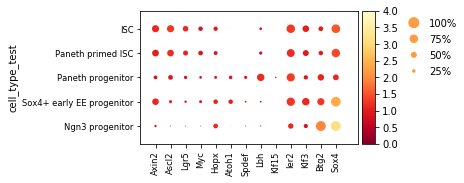

In [25]:
dotplot(a_dotplot[a_dotplot.obs['genetics']=='control',], color_map='YlOrRd_r',
              save=today+'_control_Wnt_TFs.pdf', max_scale=cmax, min_scale=0,
              groupby='cell_type_test', var_names=np.concatenate([canonical_wnt_genes, more_interesting_genes]))

#sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='mutant',], color_map='Blues_r',
#              var_group_positions =  [(0,4), (5,12)], save=today+'_mutant_Wnt_TFs.pdf',
#              groupby='proma_cell_type', 
#              var_names=np.concatenate([canonical_wnt_genes, more_interesting_genes]))

In [27]:
differential_TFs_mutant_control = pd.read_csv('./table/TFs_diff_progenitors_mutant_control_Oct.csv', header=0, index_col=None)

In [31]:
len(np.sort(differential_TFs_mutant_control['x'].values))/2

56.5

saving figure to file ./figures/dotplot181105_dotplot_Paneth primed ISCpart1.pdf


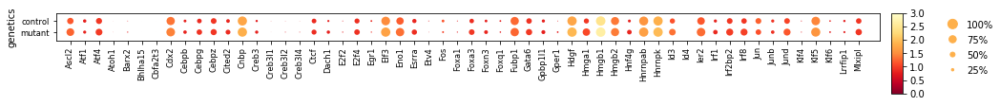

saving figure to file ./figures/dotplot181105_dotplot_Paneth primed ISCpart2.pdf


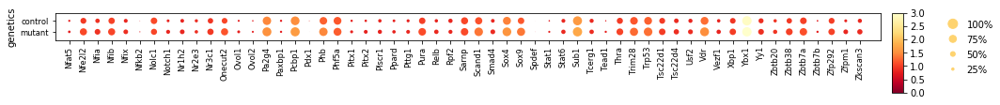

saving figure to file ./figures/dotplot181105_dotplot_Paneth progenitorpart1.pdf


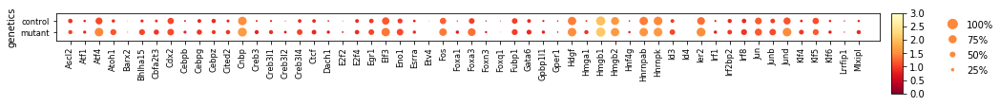

saving figure to file ./figures/dotplot181105_dotplot_Paneth progenitorpart2.pdf


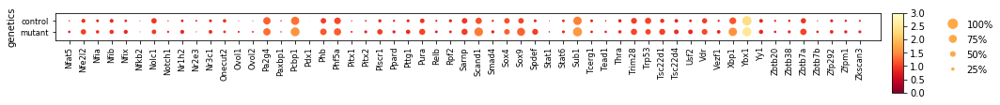

saving figure to file ./figures/dotplot181105_dotplot_Sox4+ early EE progenitorpart1.pdf


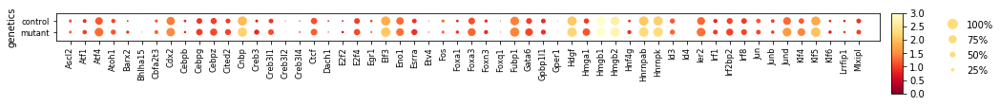

saving figure to file ./figures/dotplot181105_dotplot_Sox4+ early EE progenitorpart2.pdf


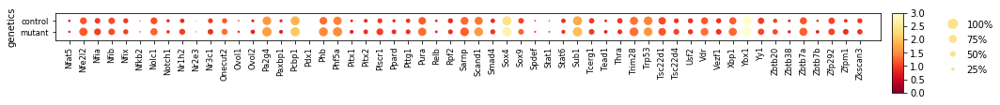

saving figure to file ./figures/dotplot181105_dotplot_Ngn3 progenitorpart1.pdf


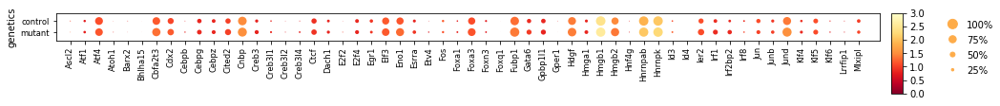

saving figure to file ./figures/dotplot181105_dotplot_Ngn3 progenitorpart2.pdf


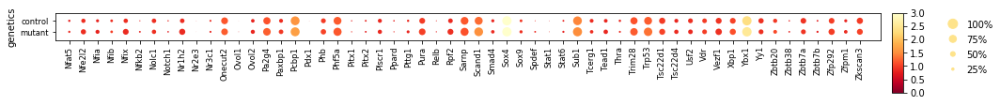

In [ ]:
for cell_type in ['Paneth primed ISC', 'Paneth progenitor',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor']:
    
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], color_map='YlOrRd_r', max_scale=3, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ 'part1.pdf',
              # var_group_positions = [(0,4), (5,9),(10,15)],
              groupby='genetics', var_names=np.sort(differential_TFs_mutant_control['x'].values)[:56])
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], color_map='YlOrRd_r', max_scale=3, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ 'part2.pdf',
              # var_group_positions = [(0,4), (5,9),(10,15)],
              groupby='genetics', var_names=np.sort(differential_TFs_mutant_control['x'].values)[56:])


saving figure to file ./figures/dotplot181105_dotplot_Paneth primed ISCwnt_genes.pdf


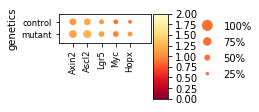

saving figure to file ./figures/dotplot181105_dotplot_Paneth progenitorwnt_genes.pdf


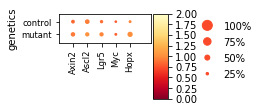

saving figure to file ./figures/dotplot181105_dotplot_Sox4+ early EE progenitorwnt_genes.pdf


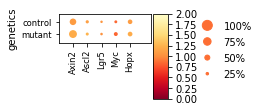

saving figure to file ./figures/dotplot181105_dotplot_Ngn3 progenitorwnt_genes.pdf


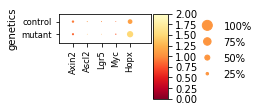

In [16]:
for cell_type in ['Paneth primed ISC', 'Paneth progenitor',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor']:
    
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], color_map='YlOrRd_r', max_scale=2, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ 'wnt_genes.pdf',
              # var_group_positions = [(0,4), (5,12)],
              groupby='genetics', var_names=canonical_wnt_genes)


saving figure to file ./figures/dotplot181105_dotplot_Paneth primed ISC_receptors.pdf


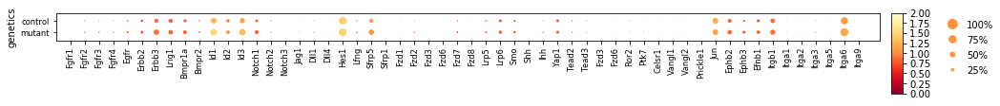

saving figure to file ./figures/dotplot181105_dotplot_Paneth progenitor_receptors.pdf


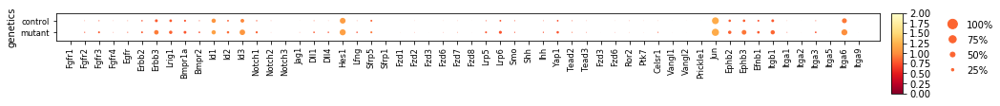

saving figure to file ./figures/dotplot181105_dotplot_Sox4+ early EE progenitor_receptors.pdf


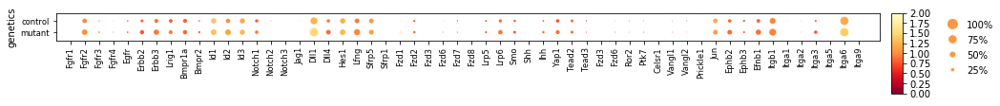

saving figure to file ./figures/dotplot181105_dotplot_Ngn3 progenitor_receptors.pdf


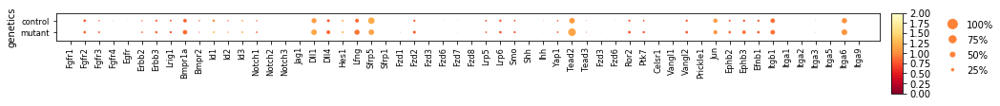

In [15]:
for cell_type in ['Paneth primed ISC', 'Paneth progenitor',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor']:
    
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], color_map='YlOrRd_r', max_scale=2, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ '_receptors.pdf',
              #var_group_positions = [(0,4), (5,9), (10,15)],
              groupby='genetics', var_names=receptors)


After some thorough investigation of the differential TFs, I have decided to re-order them according to the logFC in Paneth primed ISCs.

In [45]:
TF_ordered = ['Sox9',
'Vdr'
,'Hmga1'
,'Ascl2'
,'Sox4'
,'Onecut2'
,'Irf2bp2'
,'Mlxipl'
,'Zfpm1'
,'Zbtb20'
,'Zbtb38'
,'Pura'
,'Zkscan3'
,'Hnf4g'
,'Notch1'
,'Nfia'
,'Zfp292'
,'Foxn3'
,'Scand1'
,'Thra'
,'Foxa3'
,'Elf3'
,'Dach1'
,'Smad4'
,'Pitx2'
,'Vezf1'
,'Gper1'
,'Pdx1'
,'Etv4'
,'Lrrfip1'
,'Junb'
,'Sarnp'
,'Egr1'
,'Hmgb1'
,'Ybx1'
,'E2f4'
,'Phf5a'
,'Fubp1'
,'Hnrnpab',
'Rpf2',
'Pa2g4',
'Hnrnpk',
'Cnbp',
'Hmgb2',
'Fos',
'Nolc1','Jun']

saving figure to file ./figures/dotplot181107_dotplot_Paneth primed ISC_TF_ordered.pdf


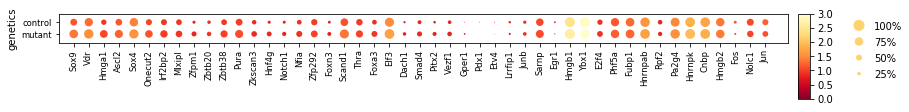

saving figure to file ./figures/dotplot181107_dotplot_Paneth progenitor_TF_ordered.pdf


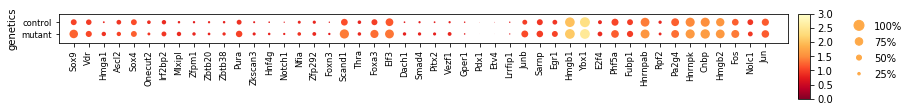

saving figure to file ./figures/dotplot181107_dotplot_Sox4+ early EE progenitor_TF_ordered.pdf


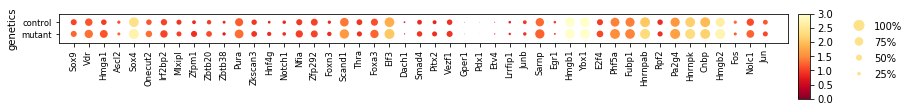

saving figure to file ./figures/dotplot181107_dotplot_Ngn3 progenitor_TF_ordered.pdf


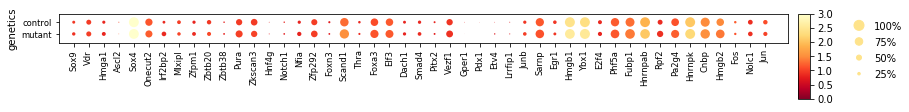

In [47]:
for cell_type in ['Paneth primed ISC', 'Paneth progenitor',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor']:
    
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], 
            color_map='YlOrRd_r', max_scale=3, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ '_TF_ordered.pdf',
              #var_group_positions = [(0,4), (5,9), (10,15)],
              groupby='genetics', var_names=TF_ordered)


In [48]:
TF_Ppc_ordered = ['Xbp1'
,'Bhlha15'
,'Atoh1'
,'Atf4'
,'Foxa3'
,'Spdef'
,'Scand1'
,'Sox9'
,'Jund'
,'Cbfa2t3'
,'Plscr1'
,'Klf4'
,'Hmga1'
,'Creb3'
,'Foxa1'
,'Creb3l2'
,'Tcerg1'
,'Nr2e3'
,'Rpf2'
,'Onecut2'
,'Hnrnpab'
,'Fubp1'
,'Cdx2'
,'Hnrnpk'
,'Hdgf'
,'Cnbp'
,'Pa2g4'
,'Nolc1'
,'Hmgb2'
,'Klf5'
,'Trp53'
,'Ybx1'
,'Hmgb1']

saving figure to file ./figures/dotplot181107_dotplot_Paneth primed ISC_TF_Ppc_ordered.pdf


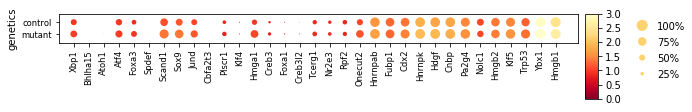

saving figure to file ./figures/dotplot181107_dotplot_Paneth progenitor_TF_Ppc_ordered.pdf


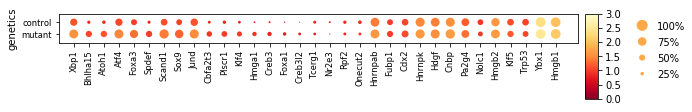

saving figure to file ./figures/dotplot181107_dotplot_Sox4+ early EE progenitor_TF_Ppc_ordered.pdf


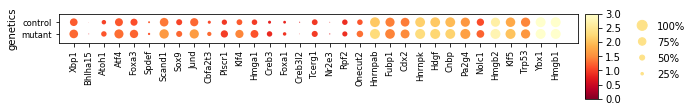

saving figure to file ./figures/dotplot181107_dotplot_Ngn3 progenitor_TF_Ppc_ordered.pdf


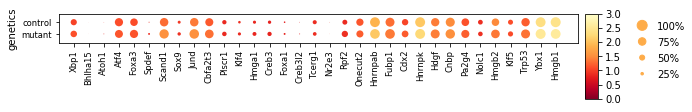

In [49]:
for cell_type in ['Paneth primed ISC', 'Paneth progenitor',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor']:
    
    dotplot(a_dotplot[a_dotplot.obs['cell_type_test']==cell_type,], 
            color_map='YlOrRd_r', max_scale=3, min_scale=0,
            save=today+ '_dotplot_' +cell_type+ '_TF_Ppc_ordered.pdf',
              #var_group_positions = [(0,4), (5,9), (10,15)],
              groupby='genetics', var_names=TF_Ppc_ordered)


saving figure to file ./figures/dotplot180913_control_refined_Wnt_TFs.pdf


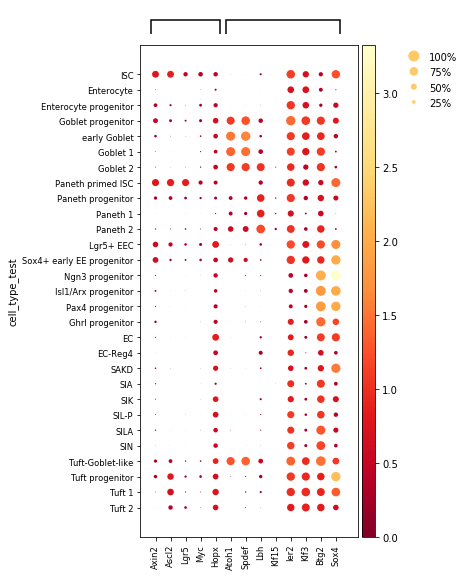

saving figure to file ./figures/dotplot180913_mutant_refined_Wnt_TFs.pdf


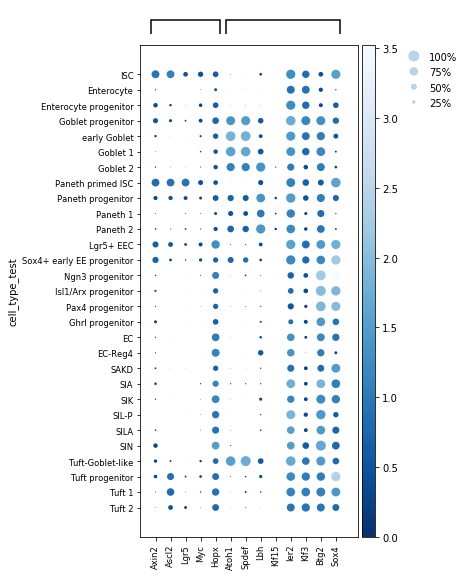

In [25]:
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='control',], color_map='YlOrRd_r',
               var_group_positions = [(0,4), (5,12)],save=today+'_control_refined_Wnt_TFs.pdf',
              groupby='cell_type_test', var_names=np.concatenate([canonical_wnt_genes, more_interesting_genes]))
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='mutant',], color_map='Blues_r',
              var_group_positions = [(0,4), (5,12)],save=today+'_mutant_refined_Wnt_TFs.pdf',
              groupby='cell_type_test', 
              var_names=np.concatenate([canonical_wnt_genes, more_interesting_genes]))

In [17]:
wnt_pcp_data = [x.strip() for x in open('./../../wntpcp_genes_10X.txt')]
wnt_pcp_genes = [x for x in wnt_pcp_data if x in a_nLy.raw.var_names]

saving figure to file ./figures/dotplot180913_control_WntPCP.pdf


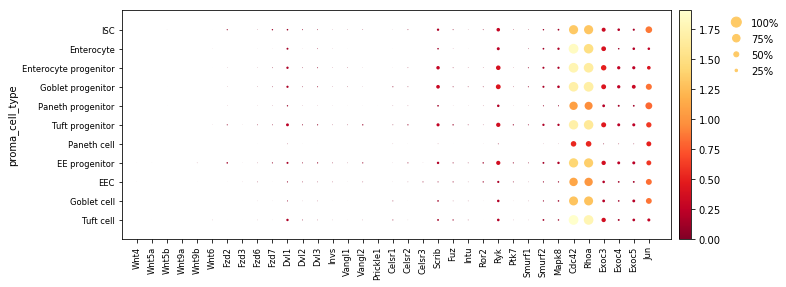

saving figure to file ./figures/dotplot180913_mutant_WntPCP.pdf


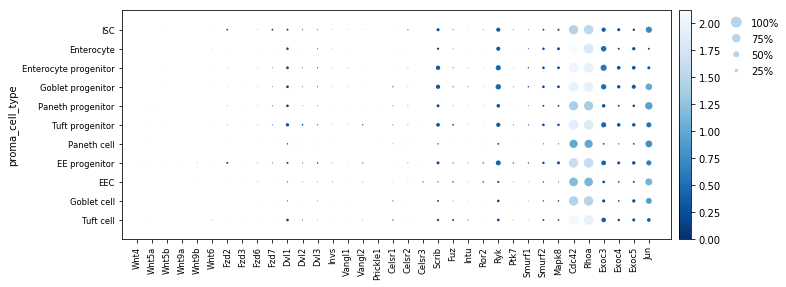

In [21]:
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='control',], color_map='YlOrRd_r',
              #var_group_positions = [(0,4), (5,12)], 
              save=today+'_control_WntPCP.pdf',
              groupby='proma_cell_type', var_names=wnt_pcp_genes)
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='mutant',], color_map='Blues_r',
              #var_group_positions =  [(0,4), (5,12)], 
              save=today+'_mutant_WntPCP.pdf',
              groupby='proma_cell_type', 
              var_names=wnt_pcp_genes)

saving figure to file ./figures/dotplot180913_control_refined_WntPCP.pdf


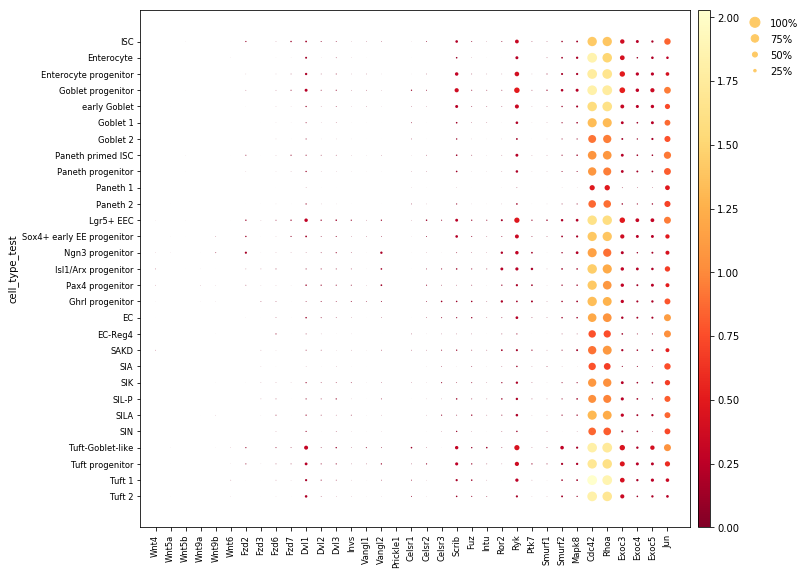

saving figure to file ./figures/dotplot180913_mutant_refined_WntPCP.pdf


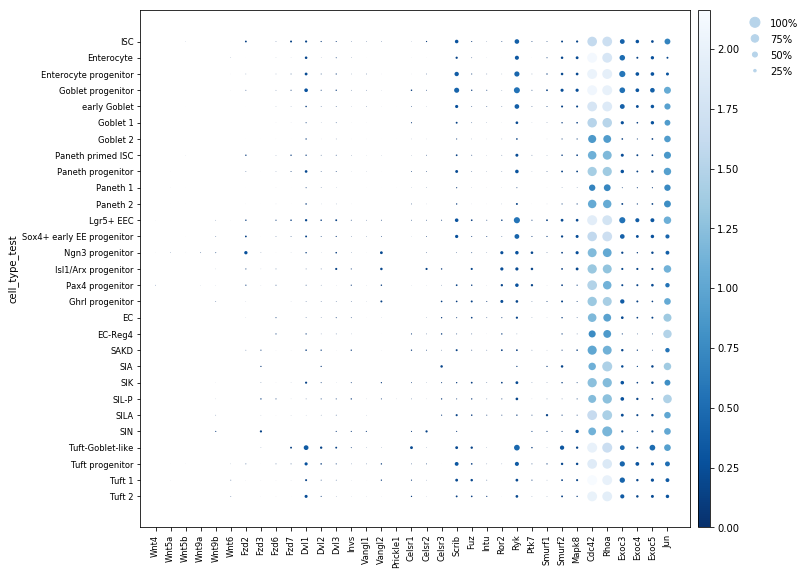

In [22]:
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='control',], color_map='YlOrRd_r',
              #var_group_positions = [(0,4), (5,12)], 
              save=today+'_control_refined_WntPCP.pdf',
              groupby='cell_type_test', var_names=wnt_pcp_genes)
sc.pl.dotplot(a_nLy[a_nLy.obs['genetics']=='mutant',], color_map='Blues_r',
              #var_group_positions =  [(0,4), (5,12)], 
              save=today+'_mutant_refined_WntPCP.pdf',
              groupby='cell_type_test', 
              var_names=wnt_pcp_genes)

# Graph abstraction

Let us determine if the abstracted graph changes if we use the mutant samples.

In [11]:
adata = sc.read('./write/gut_AB_AL_annotated_mutants.h5ad')

In [12]:
sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:36.40) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


In [64]:
adata

AnnData object with n_obs × n_vars = 72202 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_refined', 'doublet_score', 'cell_type_test', 'proma_cell_type'
    var: 'mean', 'dispersion'
    uns: 'cell_type_colors', 'cell_type_refined_colors', 'cell_type_test_colors', 'genetics_colors', 'louvain', 'louvain_colors', 'mean_pca_EE progenitor_control', 'mean_pca_EE progenitor_mutant', 'mean_pca_EEC_control', 'mean_pca_EEC_mutant', 'mean_pca_Enterocyte progenitor_control', 'mean_pca_Enterocyte progenitor_mutant', 'mean_pca_Enterocyte_control', 'mean_pca_Enterocyte_mutant', 'mean_pca_Goblet cell_control', 'mean_pca_Goblet cell_mutant', 'mean_pca_Goblet progenitor_control', 'mean_pca_Goblet progenitor_mutant', 'mean_pca_ISC_control', 'mean_pca_ISC_mutant', 'mean_pca_Paneth cell_control', 'mean_pca_Paneth cell_mutant', 'mean_pca_Paneth progenitor_control', 'mean_pca_Paneth progenitor_

In [65]:
adata.obs['cell_type_test'].cat.categories

Index(['ISC', 'Enterocyte', 'Enterocyte progenitor', 'Goblet progenitor',
       'early Goblet', 'Goblet 1', 'Goblet 2', 'Paneth primed ISC',
       'Paneth progenitor', 'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
       'Sox4+ early EE progenitor', 'Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN', 'Tuft progenitor', 'Tuft 1', 'Tuft 2'],
      dtype='object')

In [66]:
adata.obs['proma_cell_type'] = adata.obs['cell_type_test'].cat.add_categories([
         'Goblet cell', 'Paneth cell', 'EE progenitor',
       'EEC', 'Tuft cell'
])

In [67]:

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['ISC', 'Paneth primed ISC'])] = np.repeat(
    'ISC', np.in1d(adata.obs['cell_type_test'], 
                         ['ISC', 'Paneth primed ISC']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['early Goblet', 'Goblet progenitor'])] = np.repeat(
    'Goblet progenitor', np.in1d(adata.obs['cell_type_test'], 
                         ['early Goblet', 'Goblet progenitor']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['Goblet 1', 'Goblet 2'])] = np.repeat(
    'Goblet cell', np.in1d(adata.obs['cell_type_test'], 
                         ['Goblet 1', 'Goblet 2']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['Paneth 1', 'Paneth 2'])] = np.repeat(
    'Paneth cell', np.in1d(adata.obs['cell_type_test'], 
                         ['Paneth 1', 'Paneth 2']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['Tuft 1', 'Tuft 2', 'Tuft-Goblet-like'])] = np.repeat(
    'Tuft cell', np.in1d(adata.obs['cell_type_test'], 
                         ['Tuft 1', 'Tuft 2', 'Tuft-Goblet-like']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['Lgr5+ EEC', 'Sox4+ early EE progenitor'])] = np.repeat(
    'EE progenitor', np.in1d(adata.obs['cell_type_test'], 
                         ['Lgr5+ EEC', 'Sox4+ early EE progenitor']).sum())

adata.obs['proma_cell_type'][np.in1d(adata.obs['cell_type_test'], 
                        ['Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN'])] = np.repeat(
    'EEC', np.in1d(adata.obs['cell_type_test'], 
                         ['Ngn3 progenitor', 'Isl1/Arx progenitor',
       'Pax4 progenitor', 'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
       'SIK', 'SIL-P', 'SILA', 'SIN']).sum())

adata.obs['proma_cell_type'] = adata.obs['proma_cell_type'].cat.remove_unused_categories()
# 'ISC', 'Paneth primed ISC', check
# 'Enterocyte progenitor', 'Enterocyte', check
# 'Goblet progenitor'== (early Goblet, Goblet progenitor), 'Goblet cell' == (Goblet 1, Goblet 2),
# 'Paneth progenitor' check, 'Paneth cell'==(Paneth 1, Paneth2)
# 'EE progenitor', 'EEC',
# 'Tuft progenitor' check, 'Tuft cell' ==(Tuft 1, Tuft 2, Tuft-Goblet-like)

In [67]:
adata.obs['proma_cell_type'].cat.categories

Index(['ISC', 'Enterocyte progenitor', 'Enterocyte', 'Goblet progenitor',
       'Goblet cell', 'Paneth progenitor', 'Paneth cell', 'EE progenitor',
       'EEC', 'Tuft progenitor', 'Tuft cell'],
      dtype='object')

In [68]:
adata.obs['proma_cell_type'] = adata.obs['proma_cell_type'].cat.reorder_categories(
    ['ISC', 'Enterocyte progenitor','Enterocyte', 'Goblet progenitor',
     'Goblet cell',#'Paneth primed ISC', 
     'Paneth progenitor','Paneth cell', 
     'EE progenitor','EEC','Tuft progenitor','Tuft cell'], ordered=True)

In [69]:
adata.uns['proma_cell_type_colors'] =adata.uns['cell_type_test_colors'][:11]
adata.uns['proma_cell_type_colors'][0] = '#A30059'  #ISC
adata.uns['proma_cell_type_colors'][1] = '#FF4A46'#Enterocyte pro 
adata.uns['proma_cell_type_colors'][2] =  '#5A0007' #Enterocyte
adata.uns['proma_cell_type_colors'][3] = '#006FA6' #Goblet pro
adata.uns['proma_cell_type_colors'][4] = '#0000A6' #Goblet cell
#adata.uns['proma_cell_type_colors'][5] = '#253756' #Paneth primed ISC'
adata.uns['proma_cell_type_colors'][5] = '#fdb462' #Paneth pro
adata.uns['proma_cell_type_colors'][6] = '#ffd92f' #Paneth cell
adata.uns['proma_cell_type_colors'][7] = '#63FFAC' #EE pro
adata.uns['proma_cell_type_colors'][8] = '#0A8201' #EEC
adata.uns['proma_cell_type_colors'][9] = '#9083CF' #Tuft pro
adata.uns['proma_cell_type_colors'][10] = '#304130' #Tuft cell


In [70]:
sc.tl.paga(adata, groups='proma_cell_type')

running partition-based graph abstraction (PAGA)
    finished (0:00:03.90) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


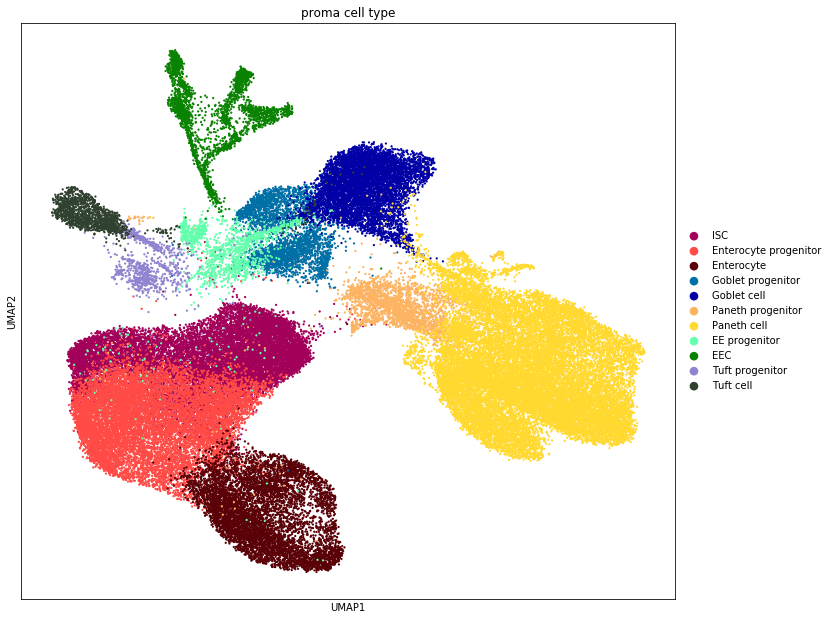

In [75]:
sc.pl.umap(adata, color='proma_cell_type',size=20)

exporting to ./write/paga_graph.gexf
--> added 'pos', the PAGA positions (adata.uns['paga'])


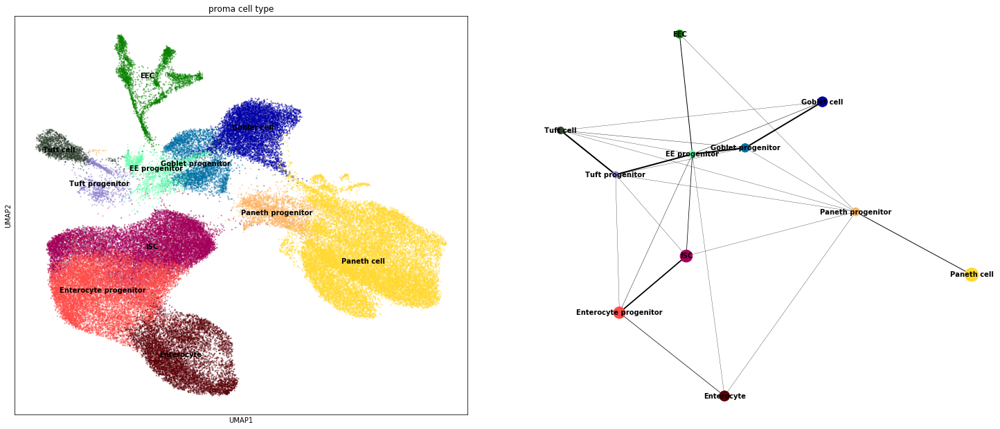

In [73]:
rcParams['figure.figsize']=(10,10)
sc.pl.paga_compare(adata, size=20, alpha=0.5, threshold=0.02, edge_width_scale=0.5, min_edge_width=0.3, max_edge_width=2, frameon=False, export_to_gexf=True)

--> added 'pos', the PAGA positions (adata.uns['paga'])
saving figure to file ./figures/paga180831_proma_mutant.pdf


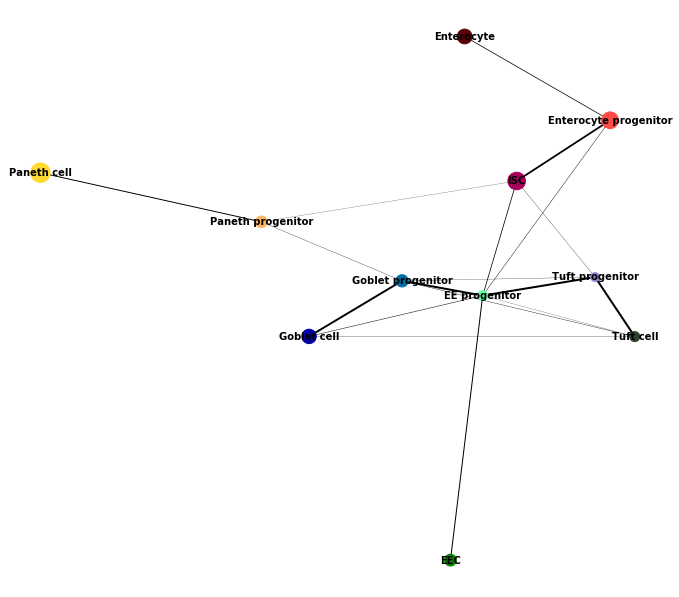

In [74]:
rcParams['figure.figsize']=(10,10)
sc.pl.paga(adata, pos='./write/paga_graph_proma.gdf',edge_width_scale=0.5, frameon=False,
           threshold=0.05,min_edge_width=0.05,max_edge_width=2, save=today+'_proma_mutant.pdf')

## mutant only samples

In [77]:
adata_sub = adata[adata.obs['genetics']=='mutant',]

In [78]:
adata_sub

View of AnnData object with n_obs × n_vars = 14136 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_refined', 'cell_type_test', 'proma_cell_type'
    var: 'mean', 'dispersion'
    uns: 'cell_type_colors', 'cell_type_refined_colors', 'cell_type_test_colors', 'genetics_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'sample_colors', 'paga', 'cell_type_test_sizes', 'proma_cell_type_colors', 'proma_cell_type_sizes'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [79]:
sc.pp.neighbors(adata_sub)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:06.41) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix


In [80]:
sc.tl.paga(adata_sub, groups='proma_cell_type')

running partition-based graph abstraction (PAGA)
    finished (0:00:01.07) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


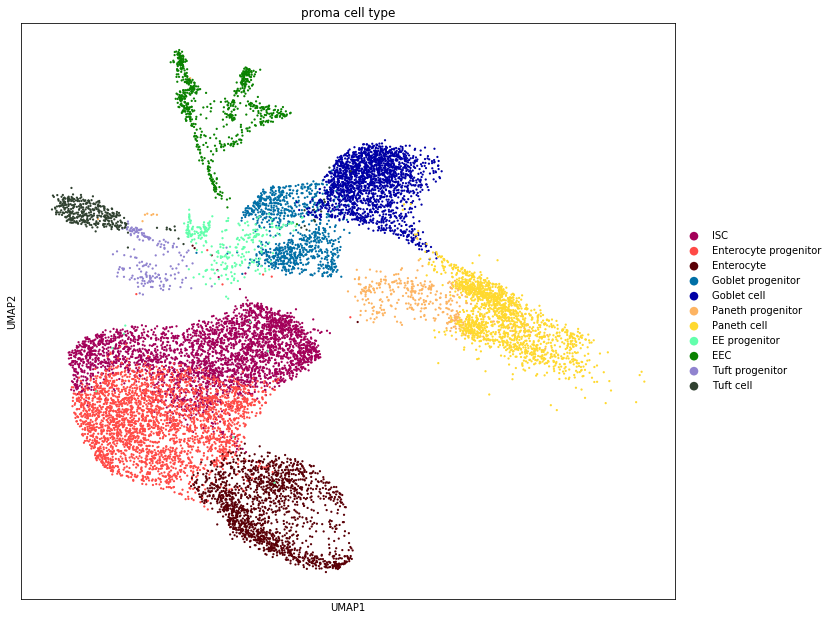

In [81]:
sc.pl.umap(adata_sub, color='proma_cell_type',size=20)

--> added 'pos', the PAGA positions (adata.uns['paga'])


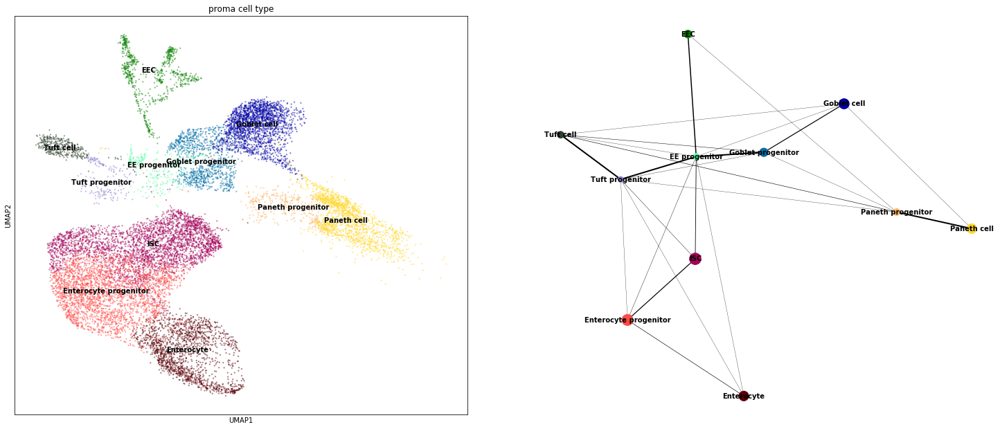

In [82]:
rcParams['figure.figsize']=(10,10)
sc.pl.paga_compare(adata_sub, size=20, alpha=0.5, threshold=0.02, edge_width_scale=0.5, min_edge_width=0.3, max_edge_width=2, frameon=False)

--> added 'pos', the PAGA positions (adata.uns['paga'])
saving figure to file ./figures/paga180831_proma_mutant_only.pdf


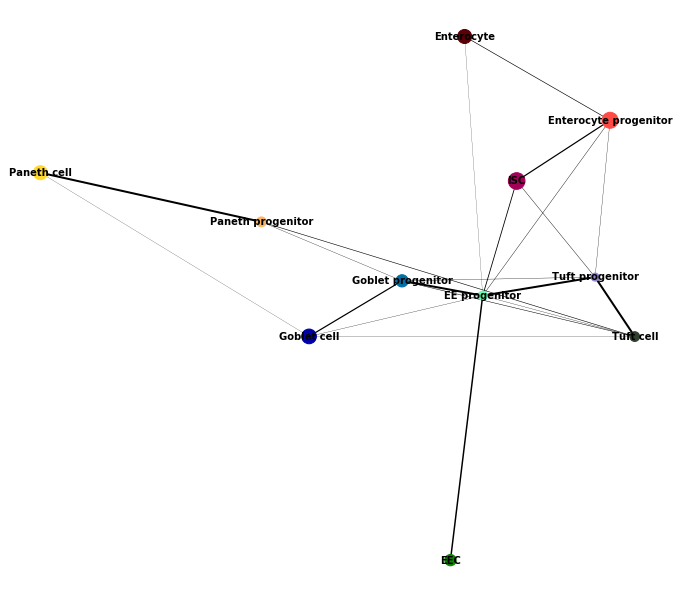

In [83]:
rcParams['figure.figsize']=(10,10)
sc.pl.paga(adata_sub, pos='./write/paga_graph_proma.gdf',edge_width_scale=0.5, frameon=False,
           threshold=0.05,min_edge_width=0.05,max_edge_width=2, save=today+'_proma_mutant_only.pdf')

# Differential tests of mutants and control

Let us inspect the cluster assignment to mutant and control. Differential testing will be performed on **raw data** using limma.

## Batch-corrected data

In [40]:
pd.crosstab(a_nLy.obs['cell_type_test'],a_nLy.obs['genetics'])

genetics,control,mutant
cell_type_test,,
ISC,8118,2295
Enterocyte,5443,1644
Enterocyte progenitor,8945,2760
Goblet progenitor,1354,537
early Goblet,1075,416
Goblet 1,4179,1854
Goblet 2,334,120
Paneth primed ISC,2898,941
Paneth progenitor,2368,396


Write annotation to file.

In [41]:
adata.obs['cell_types_final'] = adata.obs['louvain']

In [42]:
adata.obs['cell_types_final'] = adata.obs['cell_types_final'].cat.add_categories(a_nLy.obs['cell_type_test'].cat.categories)
adata.obs['cell_types_final'][a_nLy.obs.index] = a_nLy.obs['cell_type_test']

In [43]:
adata.obs['cell_types_final'].to_csv('./write/gut_AB_AL_annotate_mutants_all.csv')

In [44]:
a_nLy.obs['cell_type_test'].to_csv('./write/gut_AB_AL_annotate_mutants_wo_lymph.csv')

Save `anndata` object to file.

In [45]:
sc.write(adata=a_nLy, filename='./write/gut_AB_AL_annotated_mutants.h5ad')

In [60]:
adata = sc.read('./write/gut_AB_AL_annotated_mutants.h5ad')

In [61]:
pd.value_counts(adata.obs['genetics'])

control    58375
mutant     13827
Name: genetics, dtype: int64

In [62]:
adata

AnnData object with n_obs × n_vars = 72202 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type', 'cell_type_refined', 'doublet_score', 'cell_type_test', 'proma_cell_type'
    var: 'mean', 'dispersion'
    uns: 'cell_type_colors', 'cell_type_refined_colors', 'cell_type_test_colors', 'genetics_colors', 'louvain', 'louvain_colors', 'mean_pca_EE progenitor_control', 'mean_pca_EE progenitor_mutant', 'mean_pca_EEC_control', 'mean_pca_EEC_mutant', 'mean_pca_Enterocyte progenitor_control', 'mean_pca_Enterocyte progenitor_mutant', 'mean_pca_Enterocyte_control', 'mean_pca_Enterocyte_mutant', 'mean_pca_Goblet cell_control', 'mean_pca_Goblet cell_mutant', 'mean_pca_Goblet progenitor_control', 'mean_pca_Goblet progenitor_mutant', 'mean_pca_ISC_control', 'mean_pca_ISC_mutant', 'mean_pca_Paneth cell_control', 'mean_pca_Paneth cell_mutant', 'mean_pca_Paneth progenitor_control', 'mean_pca_Paneth progenitor_

In [16]:
sc.tl.rank_genes_groups(adata=adata, groupby='genetics', method='wilcoxon', n_genes=500)
genes_to_xls(adata=adata, filename='./table/' + today+ '_diff_expr_norm_mutant_control.xls')

ranking genes
    finished (0:01:55.24) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


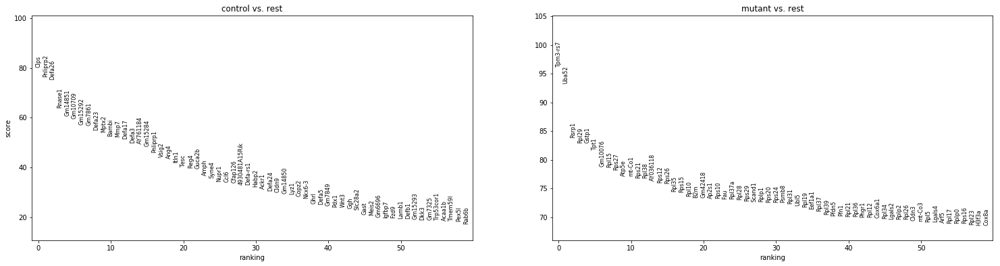

In [11]:
rcParams['figure.figsize']=(13,6)
sc.pl.rank_genes_groups(adata, n_genes=60)

Test mutant vs control in every cell type.

ISC
ranking genes
    finished (0:00:15.37) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


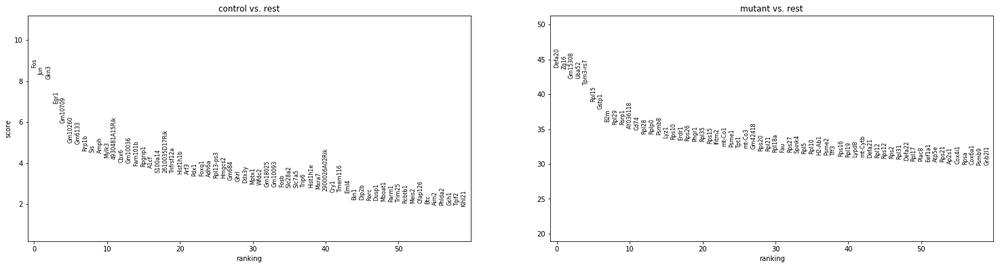

Enterocyte
ranking genes
    finished (0:00:10.39) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


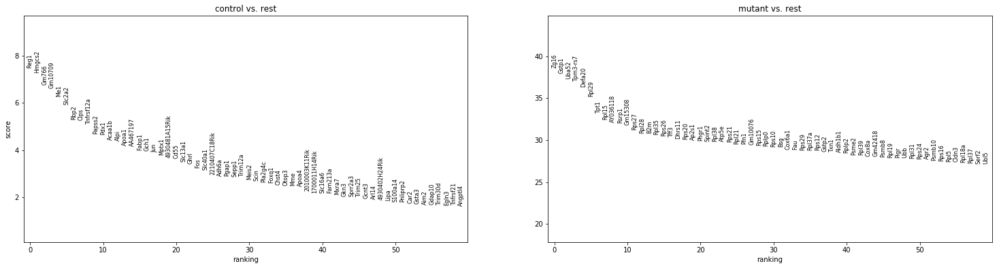

Enterocyte progenitor
ranking genes
    finished (0:00:17.91) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


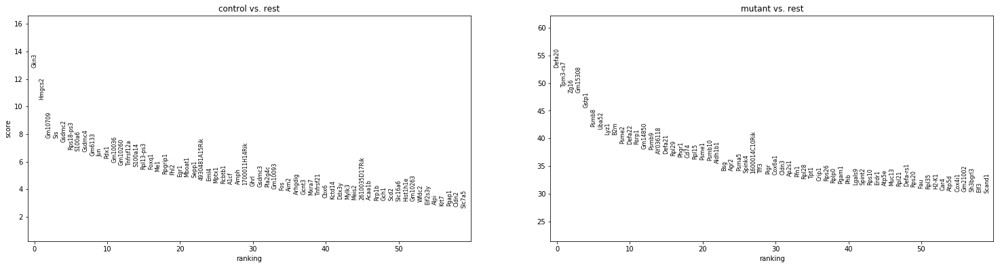

Goblet progenitor
ranking genes
    finished (0:00:02.72) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


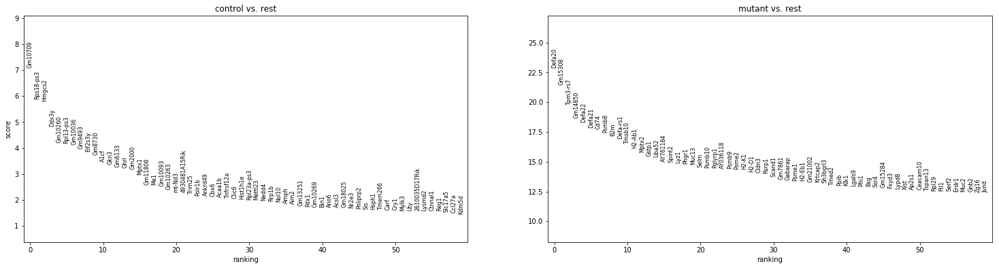

early Goblet
ranking genes
    finished (0:00:02.14) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


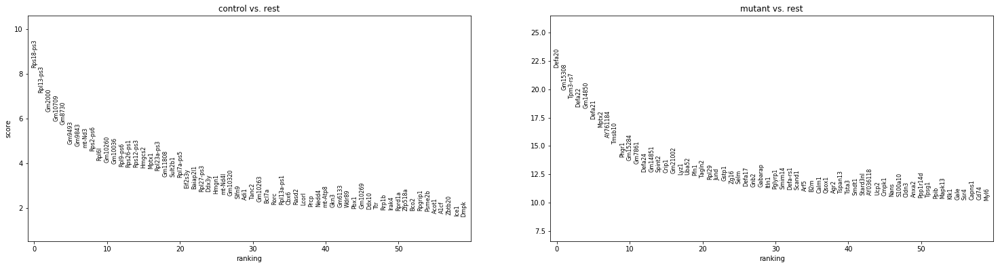

Goblet 1
ranking genes
    finished (0:00:08.81) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


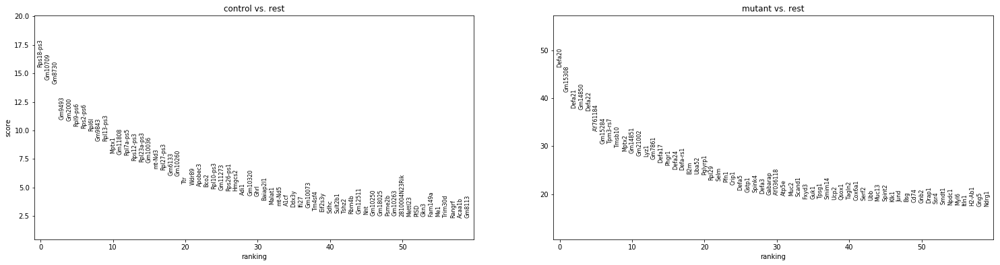

Goblet 2
ranking genes
    finished (0:00:00.67) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


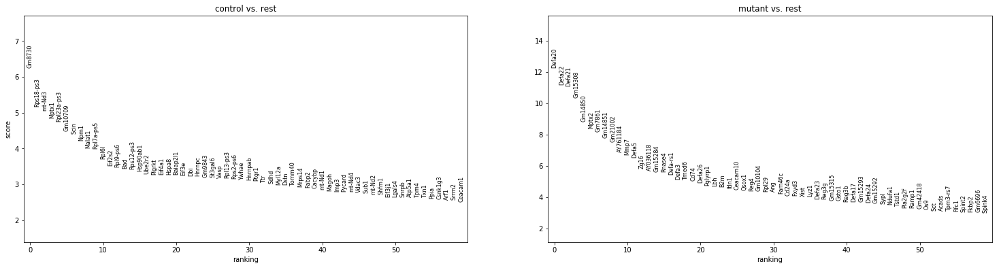

Paneth primed ISC
ranking genes
    finished (0:00:05.67) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


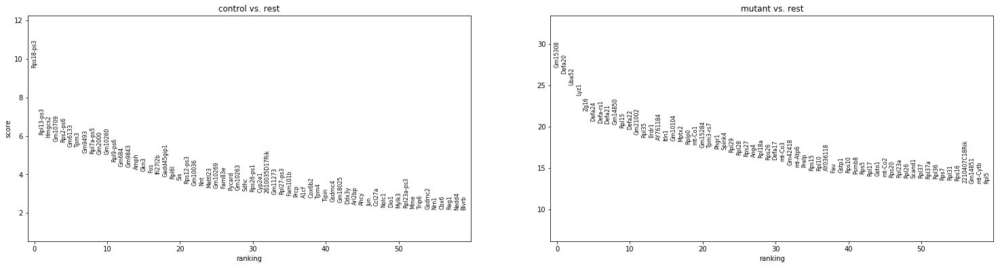

Paneth progenitor
ranking genes
    finished (0:00:04.57) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


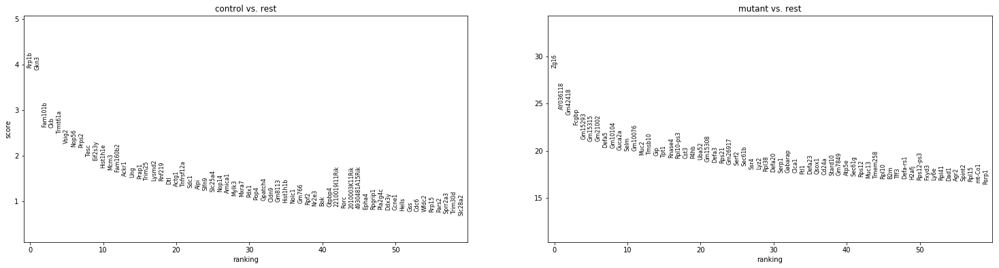

Paneth 1
ranking genes
    finished (0:00:23.55) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


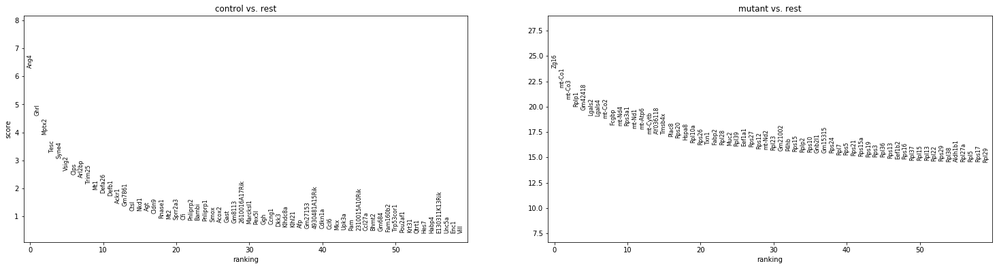

Paneth 2
ranking genes
    finished (0:00:05.37) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


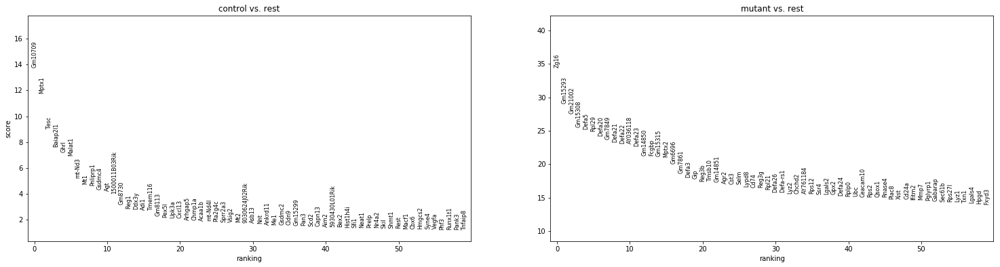

Lgr5+ EEC
ranking genes
    finished (0:00:00.68) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


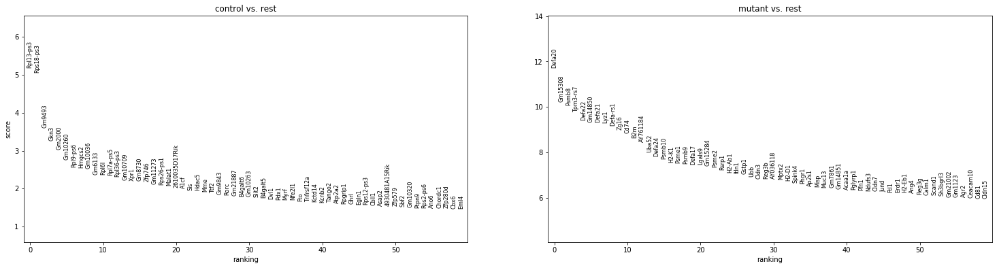

Sox4+ early EE progenitor
ranking genes
    finished (0:00:01.61) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


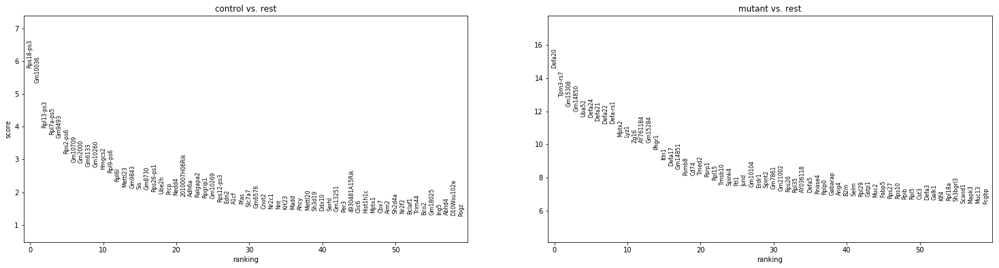

Ngn3 progenitor
ranking genes
    finished (0:00:00.51) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


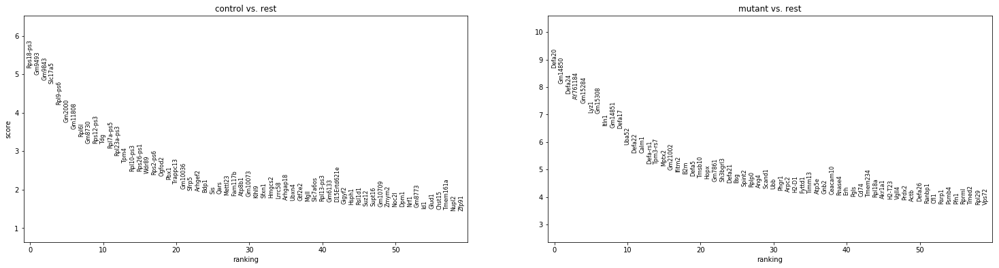

Isl1/Arx progenitor
ranking genes
    finished (0:00:00.18) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


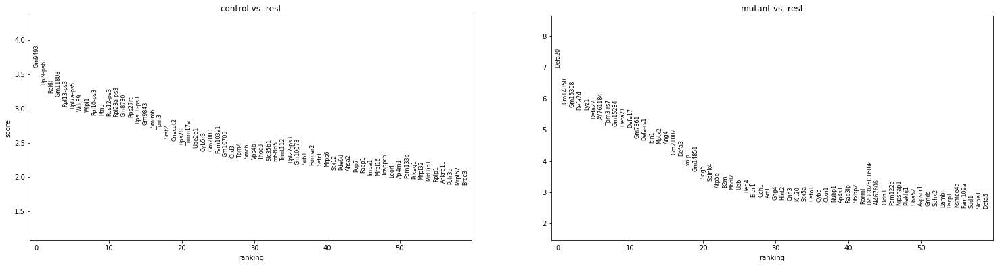

Pax4 progenitor
ranking genes
    finished (0:00:00.18) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


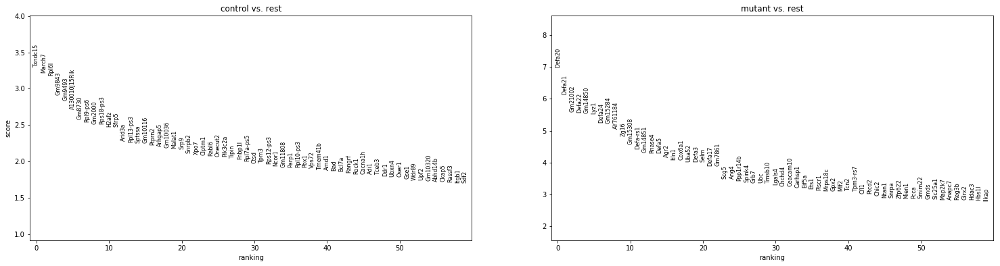

Ghrl progenitor
ranking genes
    finished (0:00:00.20) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


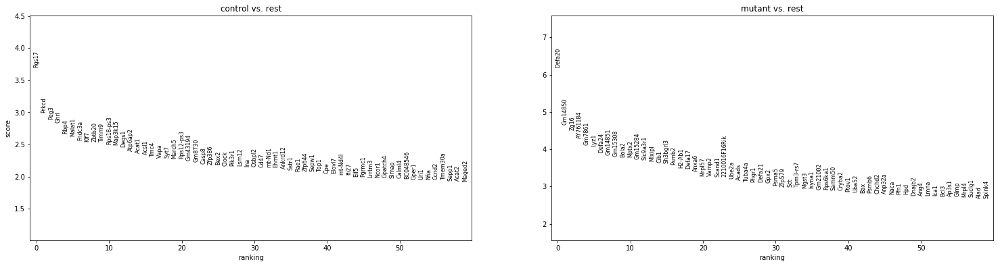

EC
ranking genes
    finished (0:00:01.10) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


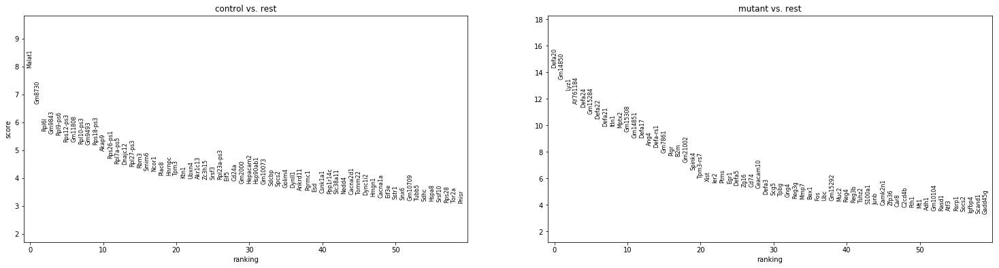

EC-Reg4
ranking genes
    finished (0:00:00.50) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


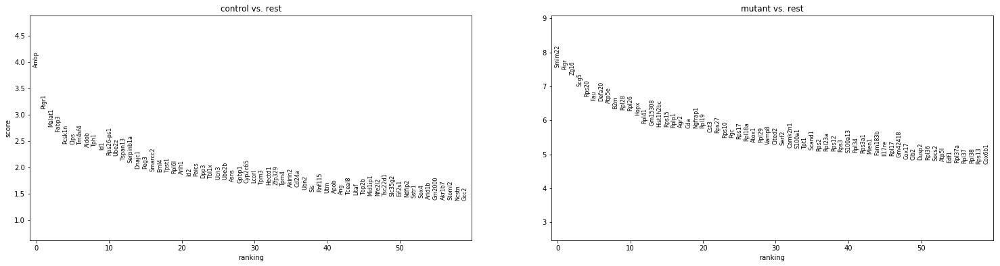

SAKD
ranking genes
    finished (0:00:00.22) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


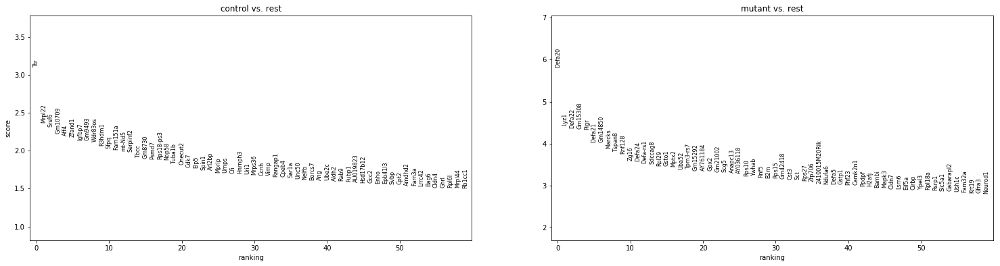

SIA
ranking genes
    finished (0:00:00.16) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


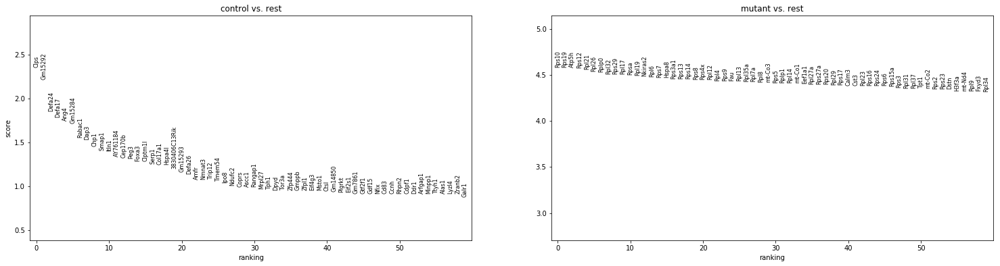

SIK
ranking genes
    finished (0:00:00.76) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


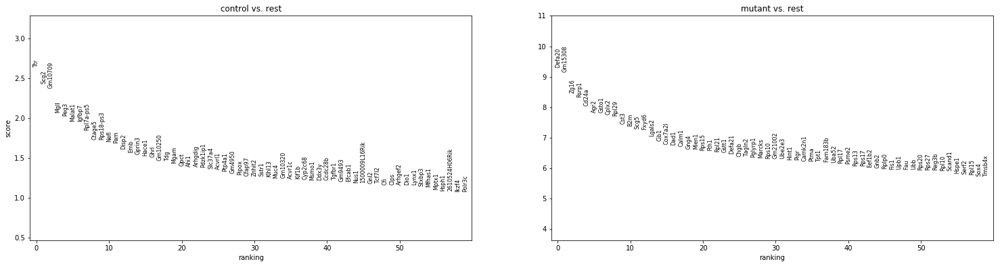

SIL-P
ranking genes
    finished (0:00:00.18) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


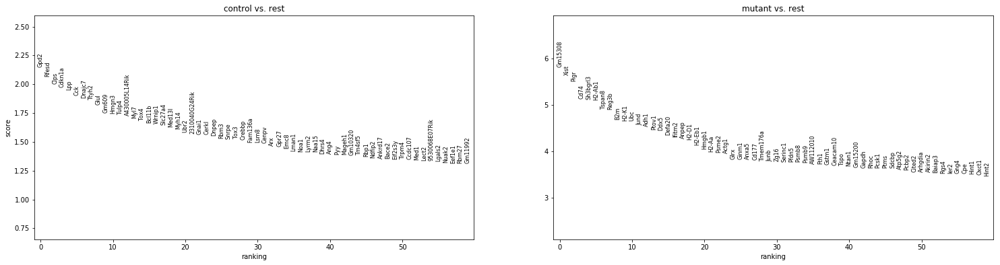

SILA
ranking genes
    finished (0:00:00.28) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


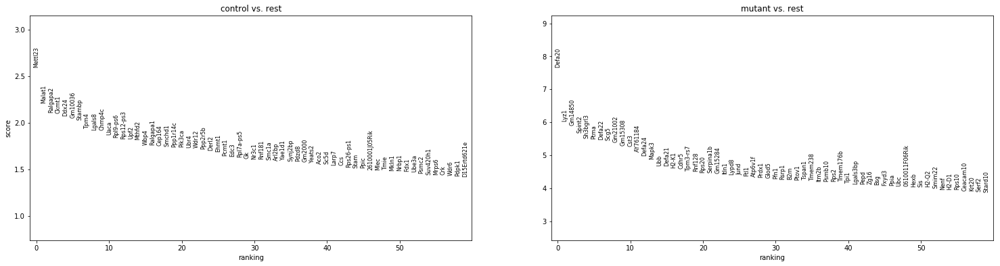

SIN
ranking genes
    finished (0:00:00.09) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


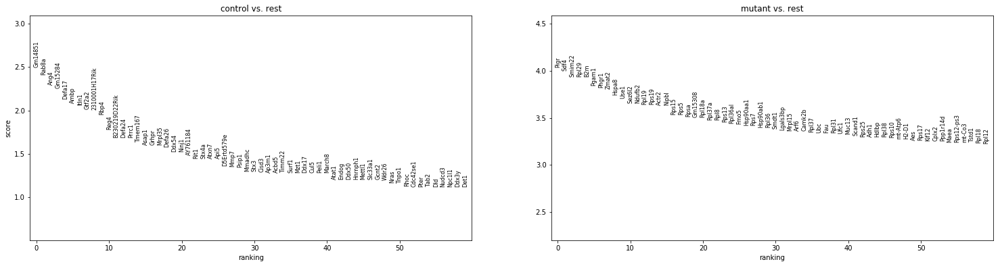

Tuft-Goblet-like
ranking genes
    finished (0:00:00.09) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


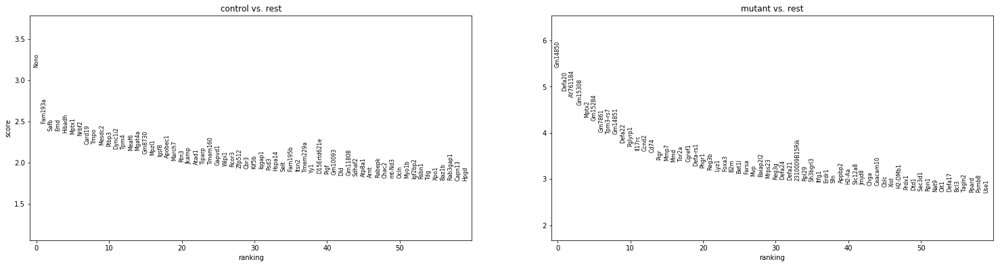

Tuft progenitor
ranking genes
    finished (0:00:01.45) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


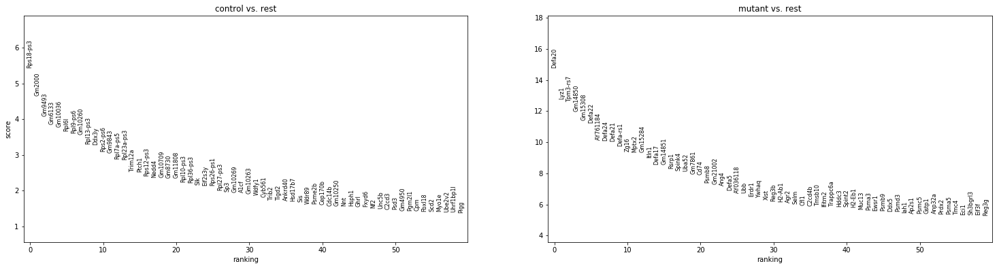

Tuft 1
ranking genes
    finished (0:00:00.94) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


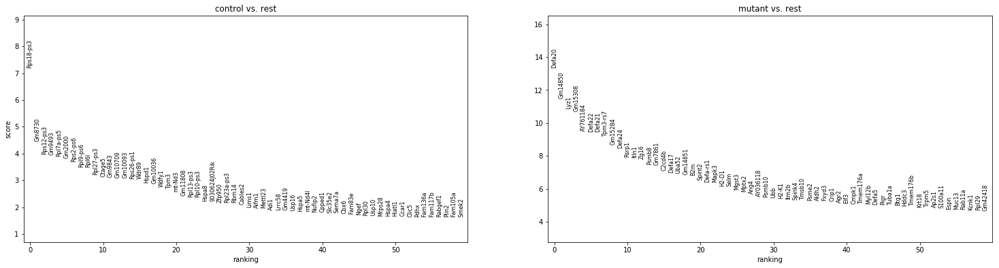

Tuft 2
ranking genes
    finished (0:00:01.32) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


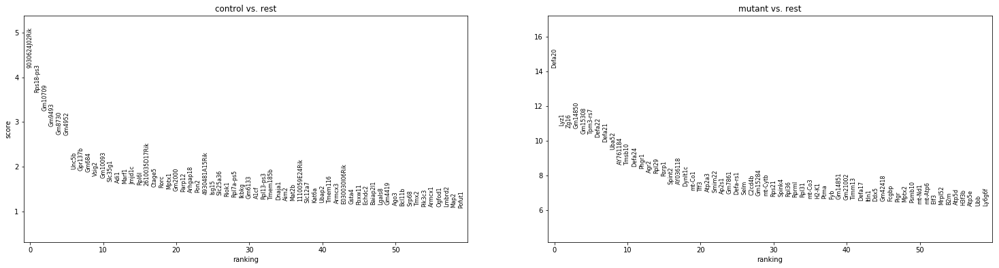

In [19]:
for typo in adata.obs['cell_type_test'].cat.categories:
    print(typo)
    tmp_data = adata[adata.obs['cell_type_test']==typo,]
    sc.tl.rank_genes_groups(adata=tmp_data, groupby='genetics', method='wilcoxon', only_positive=True, n_genes=500)
    genes_to_xls(adata=tmp_data, filename='./table/' + today+ '_diff_expr_norm_'+ typo + '_mutant_control.xls')
    rcParams['figure.figsize']=(13,6)
    sc.pl.rank_genes_groups(adata=tmp_data, n_genes=60)

## Raw-data

### Match indices

Let us inspect the raw log-transformed data. First, we have to assign the correct cell type IDs based on the corrected data set.

In [8]:
a_raw = sc.read('./write/gut_AB_AL_all.h5ad')

In [69]:
a_raw

AnnData object with n_obs × n_vars = 76142 × 15611 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'batch', 'louvain', 'doublet_score', 'genetics'
    uns: 'batch_colors', 'louvain', 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [70]:
mutantID = np.in1d(a_raw.obs['sample'], ['Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'])

In [71]:
a_raw.obs['genetics'] = pd.Series(pd.Categorical.from_codes(mutantID, categories= ['control', 'mutant'])).values


In [72]:
pd.value_counts(a_raw.obs['genetics'])

control    61305
mutant     14837
Name: genetics, dtype: int64

In [75]:
a_raw.obs_names

Index(['AAACCTGAGTCCGTAT', 'AAACCTGAGTTACGGG', 'AAACCTGCAAGTAATG',
       'AAACCTGCAGCCACCA', 'AAACCTGGTAAGAGGA', 'AAACCTGTCACCGGGT',
       'AAACGGGAGCGAAGGG', 'AAACGGGAGTGTCCCG', 'AAACGGGCAGGTCGTC',
       'AAACGGGGTAGCGTCC',
       ...
       'TTTGTCAAGACAATAC', 'TTTGTCAAGATCTGCT', 'TTTGTCAAGGCTAGCA',
       'TTTGTCAAGGTAAACT', 'TTTGTCAAGTGCGTGA', 'TTTGTCACAGCTATTG',
       'TTTGTCAGTATCGCAT', 'TTTGTCAGTTGTACAC', 'TTTGTCATCACCGGGT',
       'TTTGTCATCTCCAGGG'],
      dtype='object', length=76142)

In [24]:
adata.obs_names

Index(['AAACCTGAGAATCTCC-1-0', 'AAACCTGAGAATCTCC-1-1-0',
       'AAACCTGAGAATGTGT-1-0', 'AAACCTGAGAATTGTG-1-0', 'AAACCTGAGACAAAGG-1-0',
       'AAACCTGAGACTAGGC-1-1', 'AAACCTGAGAGACTAT-1-0', 'AAACCTGAGAGACTTA-1-0',
       'AAACCTGAGAGTAAGG-1-1', 'AAACCTGAGAGTGACC-1-0',
       ...
       'TTTGTCATCTAACTCT-1-0', 'TTTGTCATCTACGAGT-1-0', 'TTTGTCATCTCCAGGG-1-1',
       'TTTGTCATCTCGCTTG-1-1', 'TTTGTCATCTCTAGGA-1-0', 'TTTGTCATCTGCAGTA-1-0',
       'TTTGTCATCTGCAGTA-1-1-0', 'TTTGTCATCTGTCTCG-1-0',
       'TTTGTCATCTTGACGA-1-0', 'TTTGTCATCTTTACAC-1-1'],
      dtype='object', name='index', length=74491)

Match observation indexes.

In [63]:
len(np.intersect1d(adata.obs_names, a_raw.obs_names)) 

0

In [96]:
test_ref = np.asarray([x[0] for x in adata.obs_names.str.split('-')])
test_query = np.asarray([x[0] for x in a_raw.obs_names.str.split('-')])

In [97]:
a_raw.obs_names = test_query
adata.obs_names = test_ref

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [98]:
keep_ref = []
keep_query = []

In [99]:
for sample in adata.obs['sample'].cat.categories:
    print(sample)
    #get index for every sample
    sample_idx = np.flatnonzero(adata.obs['sample']==sample)
    sample_query_idx = np.flatnonzero(a_raw.obs['sample']==sample)
    #Compute cell barcodes that are present in both sets
    barcodes_both = np.intersect1d(test_ref[sample_idx], test_query[sample_query_idx])
    #reduce both data sets to the intersection of indexes
    keep_ref.extend(list(sample_idx[np.in1d(test_ref[sample_idx], barcodes_both)]))
    keep_query.extend(list(sample_query_idx[np.in1d(test_query[sample_query_idx], barcodes_both)]))

CD_1
CD_2
CD_3
Control_1
Control_2
Control_3_FVR
Control_4_FVR
Control_5_FVR
Control_6
Control_7_FVR_only
Mutant_1
Mutant_2
Mutant_3_FVR
Mutant_4_FVR


In [100]:
a_reduced = a_raw[keep_query]

In [101]:
a_reduced.obs_names_make_unique()
adata.obs_names_make_unique()

In [102]:
a_reduced = a_reduced[np.sort(a_reduced.obs_names)]
a_ref_reduced = adata[np.sort(adata.obs_names)]

In [103]:
a_reduced.obs_names

Index(['AAACCTGAGAATCTCC', 'AAACCTGAGAATCTCC-1', 'AAACCTGAGAATGTGT',
       'AAACCTGAGAATTGTG', 'AAACCTGAGACAAAGG', 'AAACCTGAGACTAGGC',
       'AAACCTGAGAGACTAT', 'AAACCTGAGAGACTTA', 'AAACCTGAGAGTAAGG',
       'AAACCTGAGAGTGACC',
       ...
       'TTTGTCATCTAACTCT', 'TTTGTCATCTACGAGT', 'TTTGTCATCTCCAGGG',
       'TTTGTCATCTCGCTTG', 'TTTGTCATCTCTAGGA', 'TTTGTCATCTGCAGTA',
       'TTTGTCATCTGCAGTA-1', 'TTTGTCATCTGTCTCG', 'TTTGTCATCTTGACGA',
       'TTTGTCATCTTTACAC'],
      dtype='object', length=72202)

In [104]:
a_ref_reduced.obs_names


Index(['AAACCTGAGAATCTCC', 'AAACCTGAGAATCTCC-1', 'AAACCTGAGAATGTGT',
       'AAACCTGAGAATTGTG', 'AAACCTGAGACAAAGG', 'AAACCTGAGACTAGGC',
       'AAACCTGAGAGACTAT', 'AAACCTGAGAGACTTA', 'AAACCTGAGAGTAAGG',
       'AAACCTGAGAGTGACC',
       ...
       'TTTGTCATCTAACTCT', 'TTTGTCATCTACGAGT', 'TTTGTCATCTCCAGGG',
       'TTTGTCATCTCGCTTG', 'TTTGTCATCTCTAGGA', 'TTTGTCATCTGCAGTA',
       'TTTGTCATCTGCAGTA-1', 'TTTGTCATCTGTCTCG', 'TTTGTCATCTTGACGA',
       'TTTGTCATCTTTACAC'],
      dtype='object', length=72202)

Export mappings, clusterings and cell type annotations.

In [105]:

a_reduced.obs['sub_cell_type'] = pd.Series(data=a_ref_reduced.obs['cell_type_test'].values,
                                           index=a_ref_reduced.obs['cell_type_test'].index,
                                           dtype="category")
a_reduced.obs['phase'] = pd.Series(data=a_ref_reduced.obs['phase'].values, 
                                   index=a_ref_reduced.obs['phase'].index,
                                   dtype="category")

In [107]:
a_reduced

AnnData object with n_obs × n_vars = 72202 × 15611 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'batch', 'louvain', 'doublet_score', 'genetics', 'sub_cell_type', 'phase'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [106]:
sc.write(adata=a_reduced, filename='./write/gut_AB_AL_nonCor_annotated.h5ad')

### Test all data

In [21]:
a_reduced = sc.read('./write/gut_AB_AL_nonCor_annotated.h5ad')

In [16]:
sc.tl.rank_genes_groups(a_reduced, groupby='genetics')

ranking genes
    finished (0:00:26.34) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


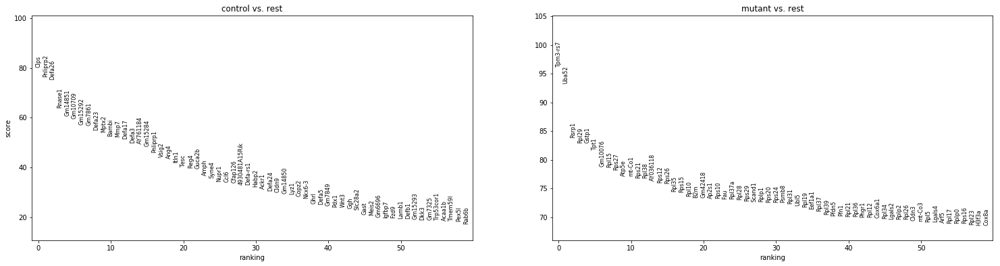

In [17]:
rcParams['figure.figsize']=(13,6)
sc.pl.rank_genes_groups(a_reduced, n_genes=60)

ISC
ranking genes
    finished (0:00:15.49) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


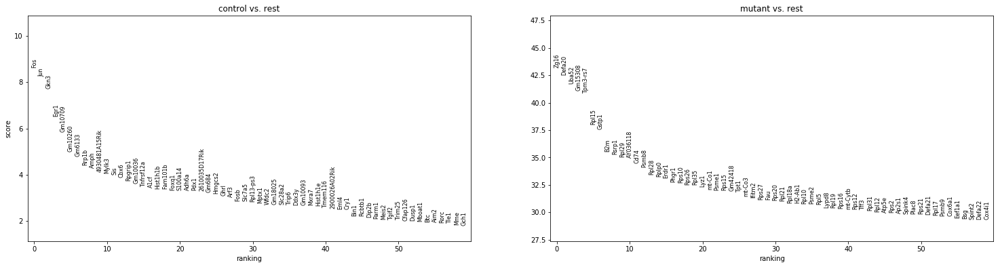

Enterocyte
ranking genes
    finished (0:00:10.02) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


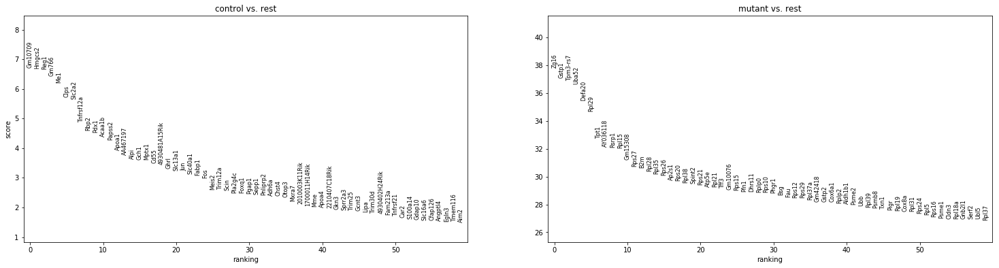

Enterocyte progenitor
ranking genes
    finished (0:00:17.47) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


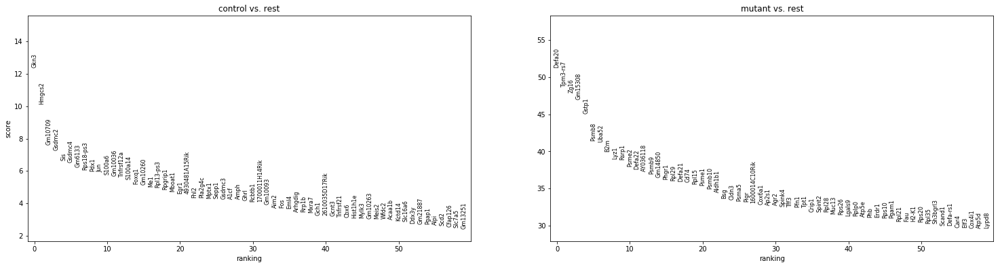

Goblet progenitor
ranking genes
    finished (0:00:02.72) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


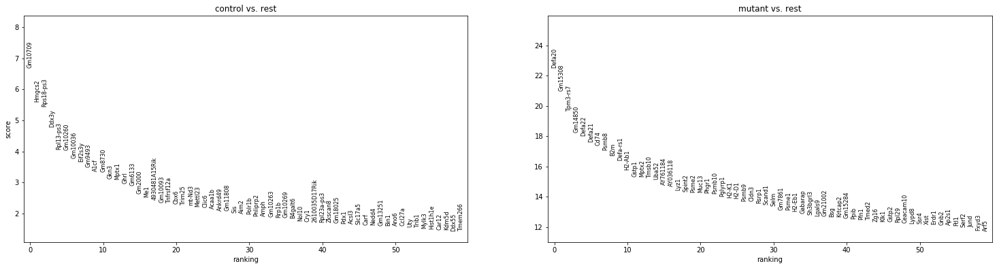

early Goblet
ranking genes
    finished (0:00:02.17) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


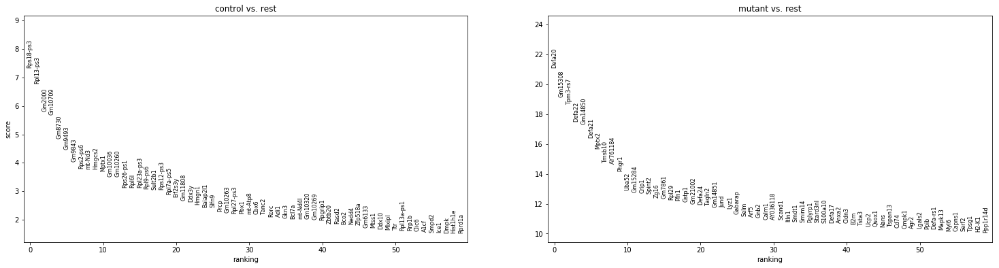

Goblet 1
ranking genes
    finished (0:00:08.51) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


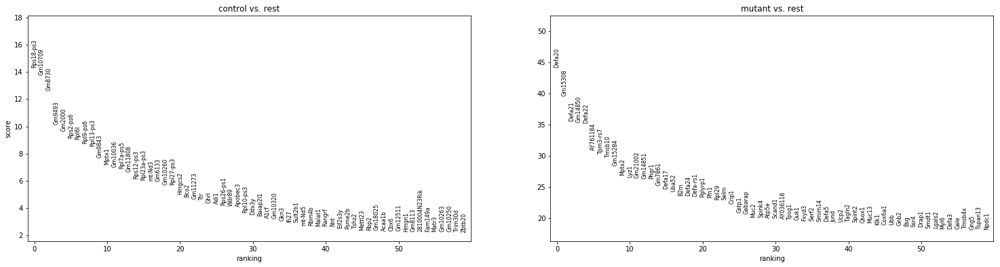

Goblet 2
ranking genes
    finished (0:00:00.60) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


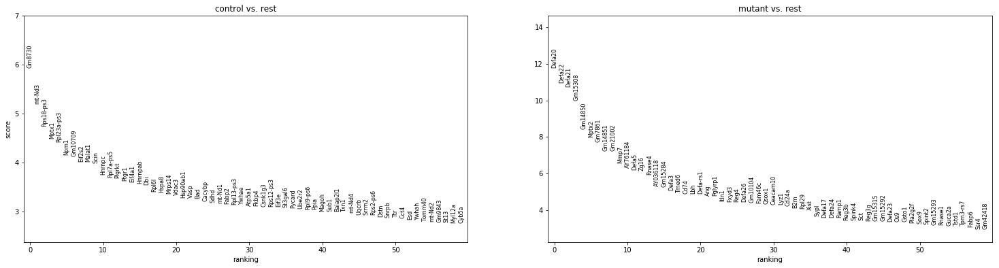

Paneth primed ISC
ranking genes
    finished (0:00:05.16) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


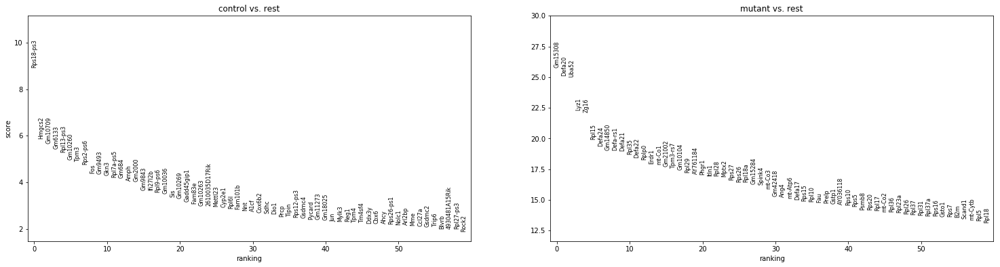

Paneth progenitor
ranking genes
    finished (0:00:03.86) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


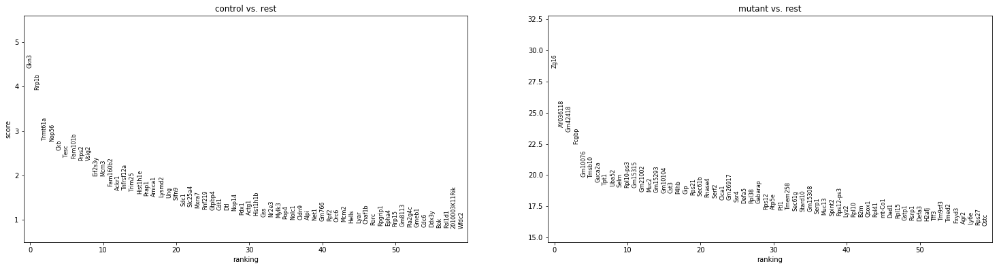

Paneth 1
ranking genes
    finished (0:00:21.72) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


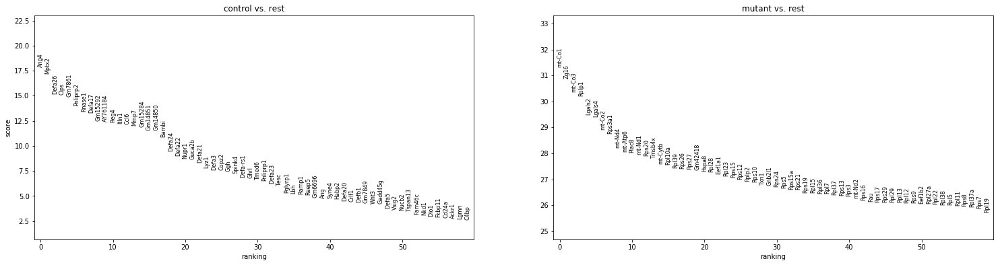

Paneth 2
ranking genes
    finished (0:00:05.31) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


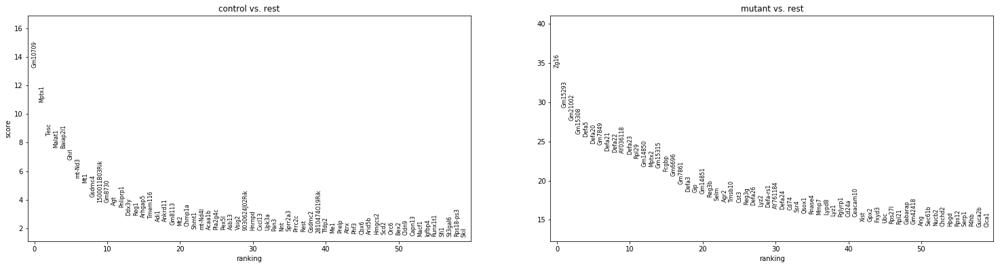

Lgr5+ EEC
ranking genes
    finished (0:00:00.66) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


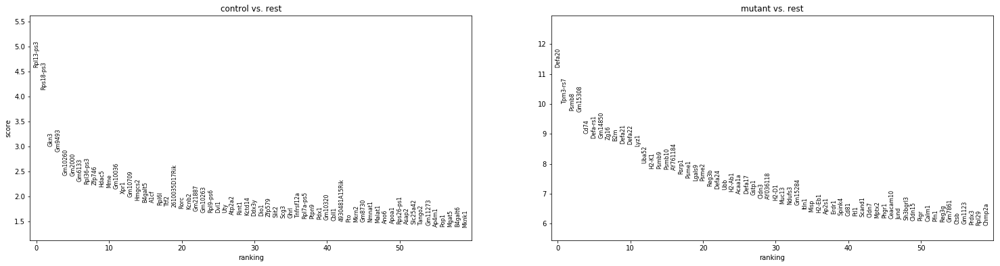

Sox4+ early EE progenitor
ranking genes
    finished (0:00:01.50) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


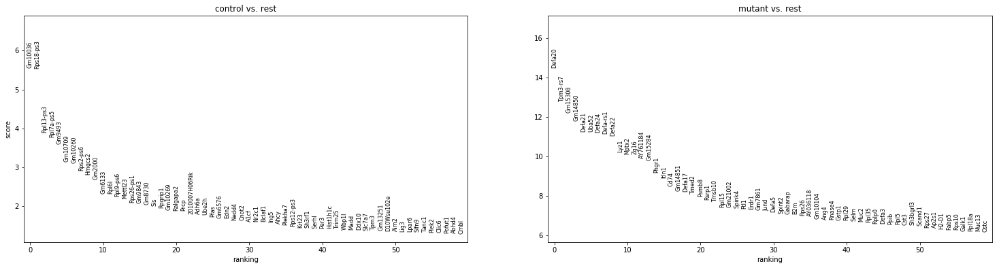

Ngn3 progenitor
ranking genes
    finished (0:00:00.36) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


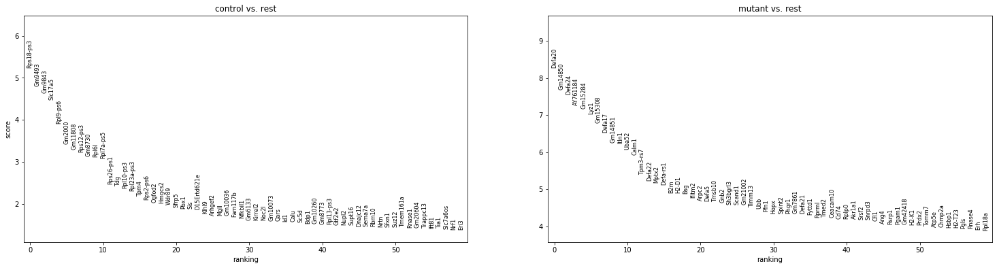

Isl1/Arx progenitor
ranking genes
    finished (0:00:00.19) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


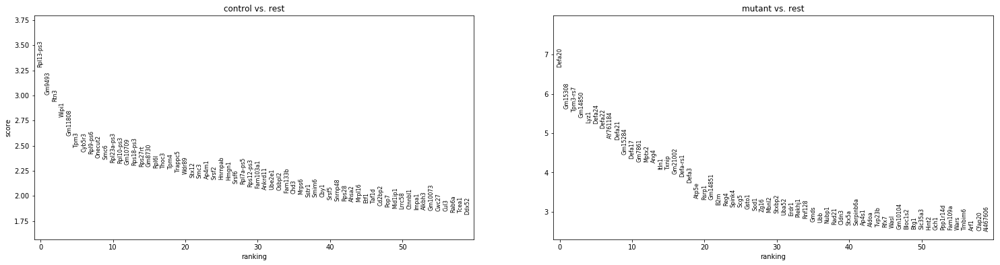

Pax4 progenitor
ranking genes
    finished (0:00:00.20) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


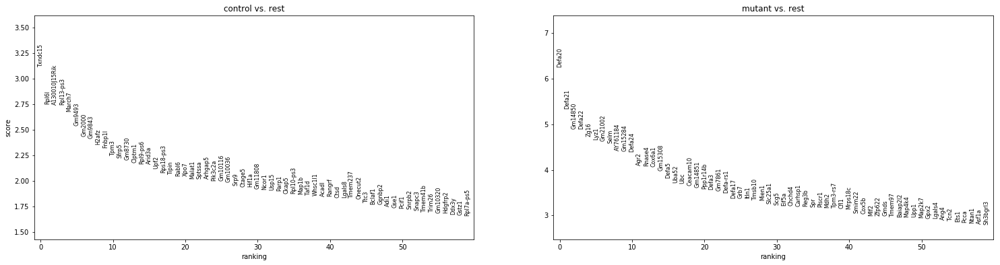

Ghrl progenitor
ranking genes
    finished (0:00:00.23) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


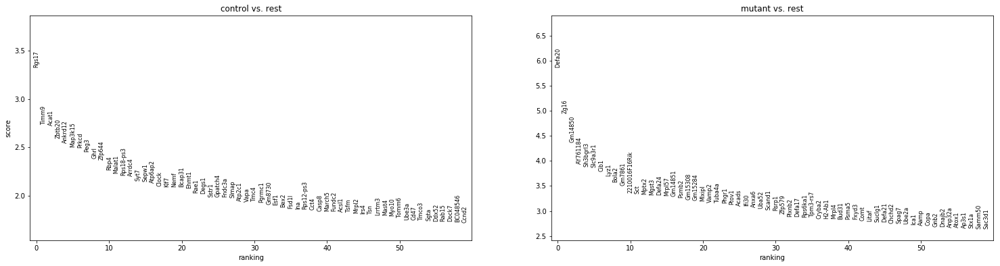

EC
ranking genes
    finished (0:00:00.93) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


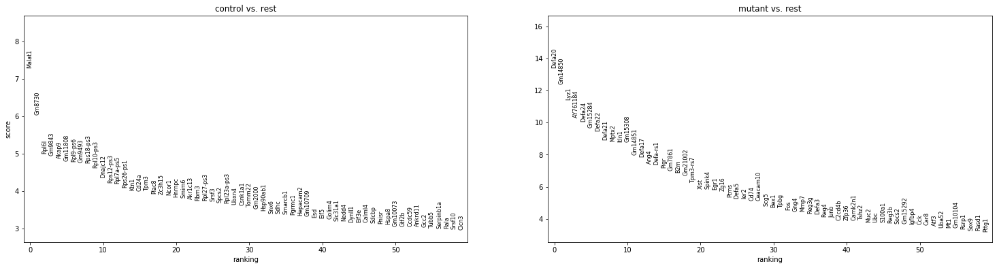

EC-Reg4
ranking genes
    finished (0:00:00.37) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


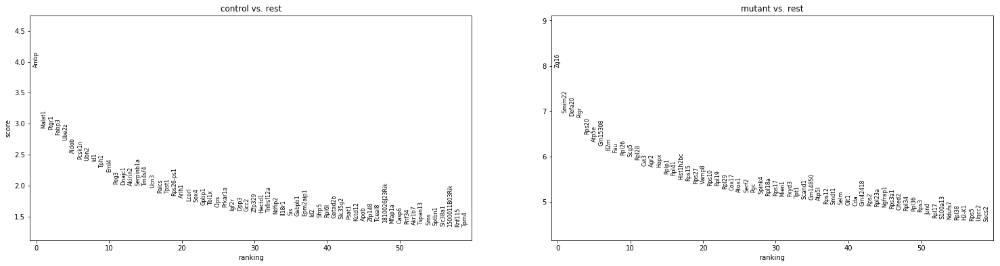

SAKD
ranking genes
    finished (0:00:00.23) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


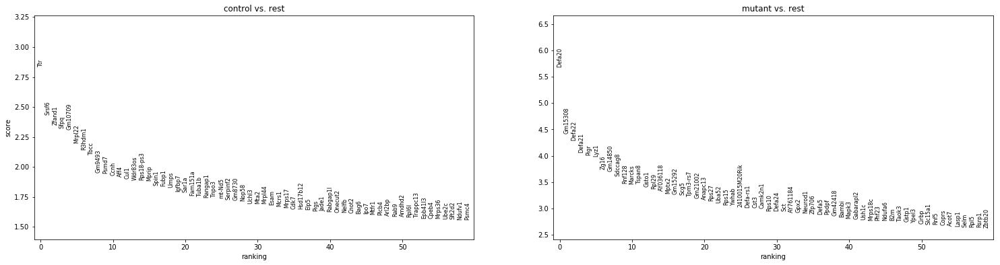

SIA
ranking genes
    finished (0:00:00.15) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


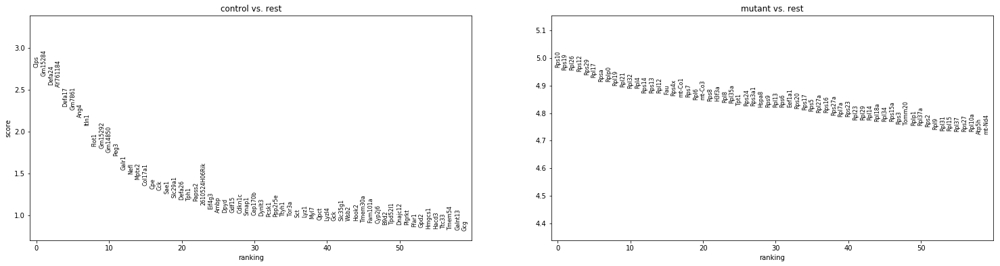

SIK
ranking genes
    finished (0:00:00.74) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


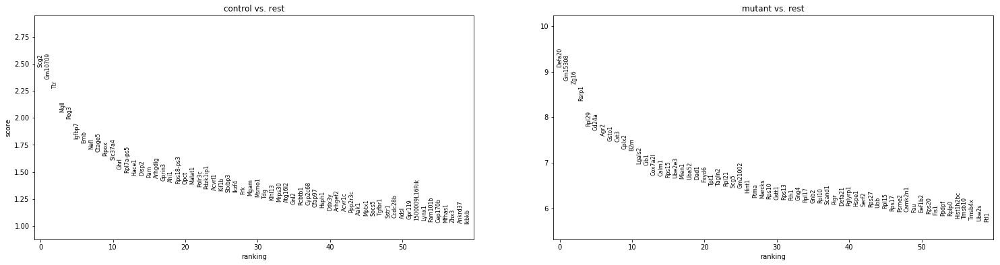

SIL-P
ranking genes
    finished (0:00:00.13) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


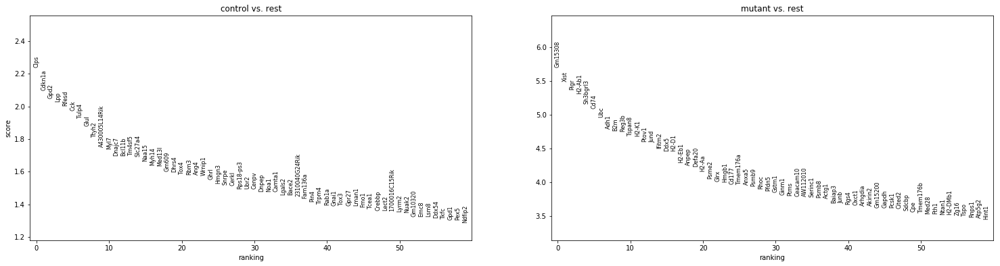

SILA
ranking genes
    finished (0:00:00.26) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


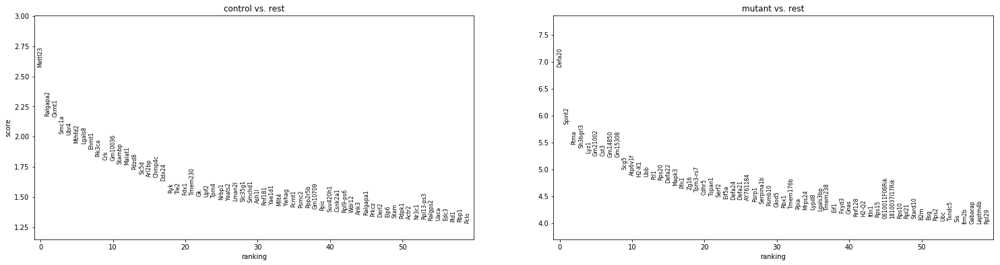

SIN
ranking genes
    finished (0:00:00.09) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


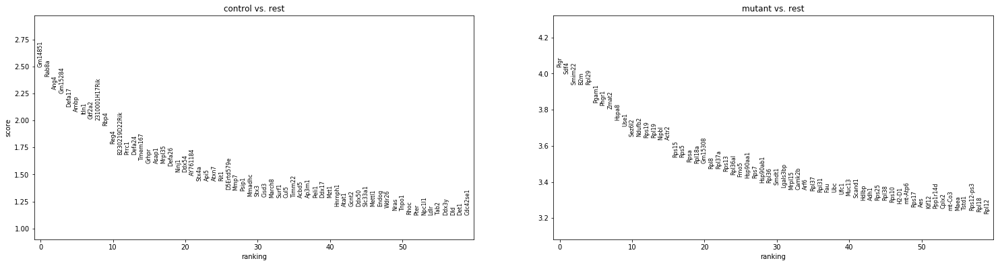

Tuft-Goblet-like
ranking genes
    finished (0:00:00.11) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


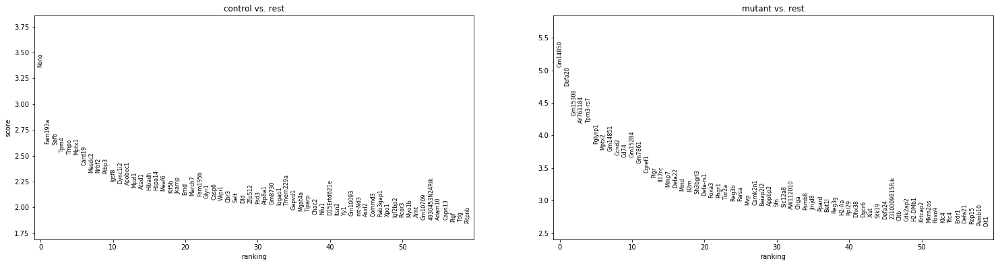

Tuft progenitor
ranking genes
    finished (0:00:01.44) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


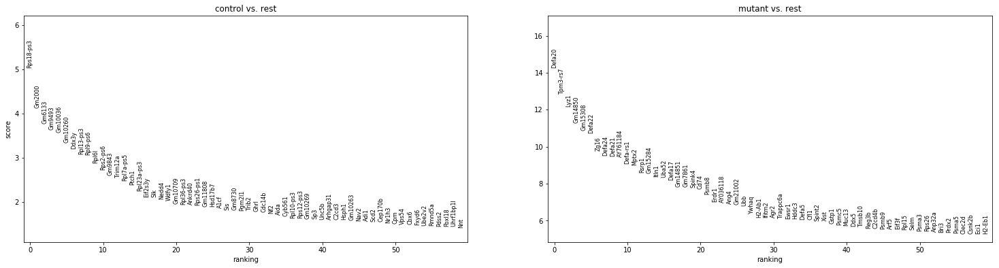

Tuft 1
ranking genes
    finished (0:00:00.86) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


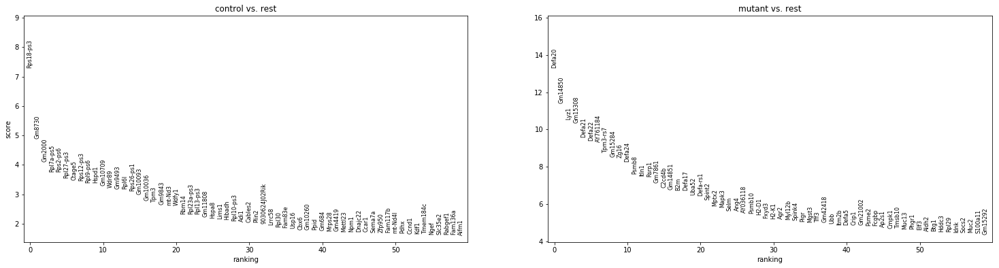

Tuft 2
ranking genes
    finished (0:00:01.30) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


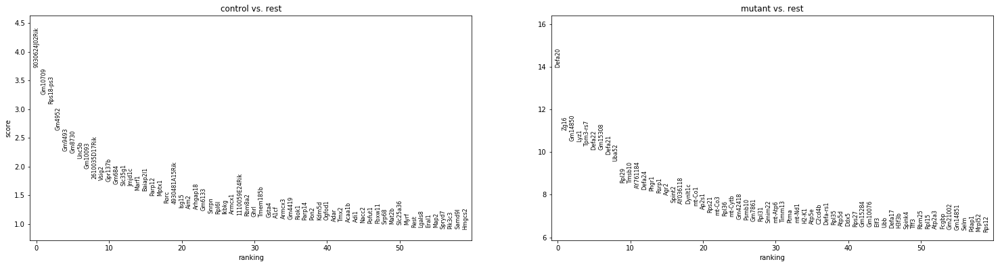

In [18]:
for typo in a_reduced.obs['sub_cell_type'].cat.categories:
    print(typo)
    tmp_data = a_reduced[a_reduced.obs['sub_cell_type']==typo,]
    sc.tl.rank_genes_groups(adata=tmp_data, groupby='genetics', method='wilcoxon', only_positive=True)
    rcParams['figure.figsize']=(13,6)
    sc.pl.rank_genes_groups(adata=tmp_data, n_genes=60)

In [50]:
pd.value_counts(a_sub.obs['sub_cell_type'])

ISC                          4607
Paneth 2                     2995
Paneth primed ISC            1830
Paneth 1                      888
Paneth progenitor             840
Sox4+ early EE progenitor     400
EC                            297
SIK                           221
Lgr5+ EEC                     191
EC-Reg4                       144
Ngn3 progenitor                96
SAKD                           80
SILA                           74
Ghrl progenitor                73
Pax4 progenitor                67
Isl1/Arx progenitor            61
SIL-P                          48
SIN                            16
SIA                            12
Name: sub_cell_type, dtype: int64

### Check gene scores

In [74]:
canonical_wnt_genes = ['Dvl2', 'Axin2', 'Ascl2', 'Lgr5', 'Myc', 'Hopx']
more_interesting_genes =['Cdkn1a', "Lbh", 'Klf15', "Ier2", 'Klf3', 'Atoh1', "Spdef", "Btg2", "Insm1", "Neurog3", "Sox4" ]

In [23]:
a_reduced.obs['proma_cell_type'] = a_reduced.obs['sub_cell_type'].cat.add_categories([ 
     "Paneth cell" , "EE progenitor"   ,"EEC"  ])
a_reduced.obs['proma_cell_type'][np.in1d(a_reduced.obs['sub_cell_type'], 
                                    ['ISC', 'Paneth primed ISC'])] = np.repeat(
    'ISC', np.in1d(a_reduced.obs['sub_cell_type'], 
                                         ['ISC', 'Paneth primed ISC']).sum())
a_reduced.obs['proma_cell_type'][np.in1d(a_reduced.obs['sub_cell_type'], 
                                    ['Paneth 1', 'Paneth 2'])] = np.repeat(
    'Paneth cell', np.in1d(a_reduced.obs['sub_cell_type'], 
                                         ['Paneth 1', 'Paneth 2']).sum())
a_reduced.obs['proma_cell_type'][np.in1d(a_reduced.obs['sub_cell_type'], 
                                    ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor'])] = np.repeat(
    'EE progenitor', np.in1d(a_reduced.obs['sub_cell_type'], 
                                         ['Lgr5+ EEC','Sox4+ early EE progenitor', 'Ngn3 progenitor']).sum())
a_reduced.obs['proma_cell_type'][np.in1d(a_reduced.obs['sub_cell_type'], 
                                    [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN'])] = np.repeat(
    'EEC', np.in1d(a_reduced.obs['sub_cell_type'], 
                                         [ 'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN']).sum())
a_reduced.obs['proma_cell_type'] = a_reduced.obs['proma_cell_type'].cat.remove_unused_categories()

In [48]:
a_sub = a_reduced[np.in1d(a_reduced.obs['sub_cell_type'],['ISC', 'Paneth primed ISC', 'Paneth progenitor',
                                                      'Paneth 1', 'Paneth 2', 'Lgr5+ EEC',
                                                       'Sox4+ early EE progenitor', 'Ngn3 progenitor',
                                                      'Isl1/Arx progenitor','Pax4 progenitor', 
                                                      'Ghrl progenitor', 'EC', 'EC-Reg4', 'SAKD', 'SIA',
                                                      'SIK', 'SIL-P', 'SILA', 'SIN'
                                                     ] )]
a_sub = a_sub[np.in1d(a_sub.obs['sample'], ['Control_1', 'Control_2', 'Control_3_FVR',
       'Control_4_FVR','Mutant_1', 'Mutant_2', 'Mutant_3_FVR', 'Mutant_4_FVR'])]

In [28]:
rcParams['figure.figsize']=(30,10)

saving figure to file ./figures/violin180830_raw_mutant_control.pdf


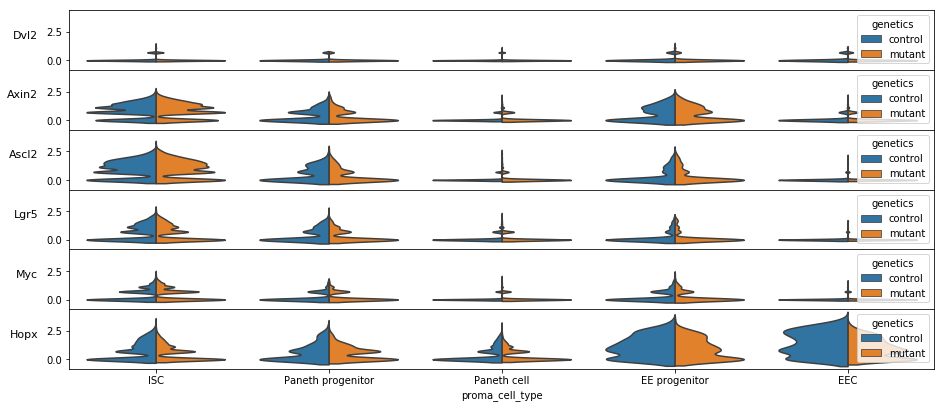

In [75]:
sc.pl.violin(a_sub, groupby='proma_cell_type', keys=canonical_wnt_genes, stripplot=False,
             multi_panel=True, hue=a_sub.obs['genetics'], split=True, save=today+'_raw_mutant_control.pdf')

### Test paired samples

In [67]:
sc.tl.rank_genes_groups(a_sub, groupby='genetics')

ranking genes
    finished (0:00:03.80) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


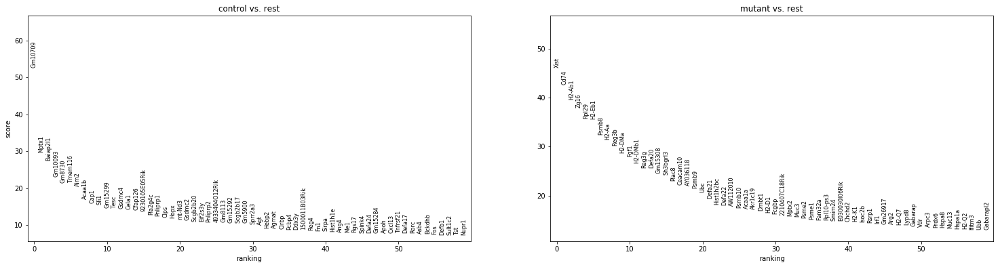

In [68]:
rcParams['figure.figsize']=(13,6)
sc.pl.rank_genes_groups(a_sub, n_genes=60)

ISC
ranking genes
    finished (0:00:09.44) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


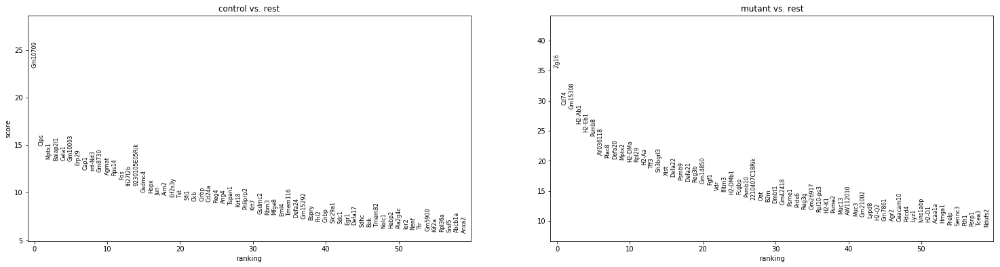

Paneth progenitor
ranking genes
    finished (0:00:01.33) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


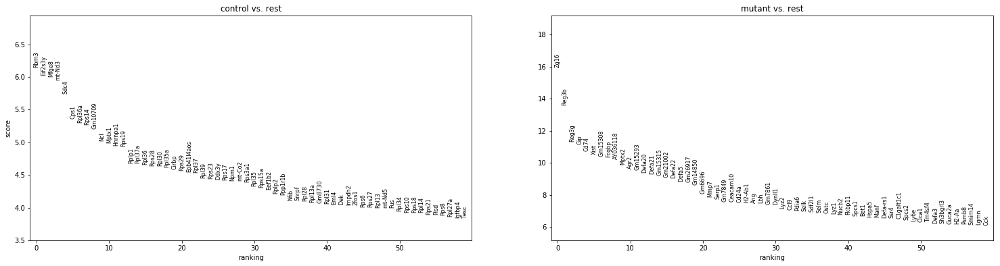

Paneth cell
ranking genes
    finished (0:00:05.18) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


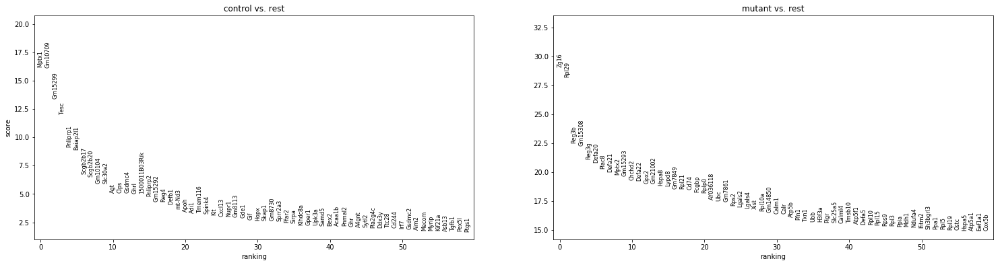

EE progenitor
ranking genes
    finished (0:00:01.07) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


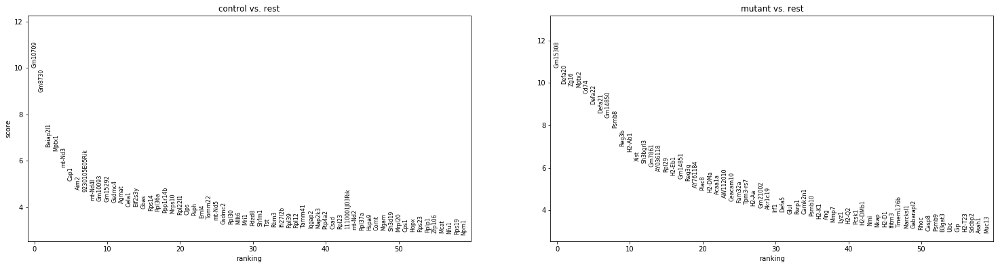

EEC
ranking genes
    finished (0:00:01.54) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


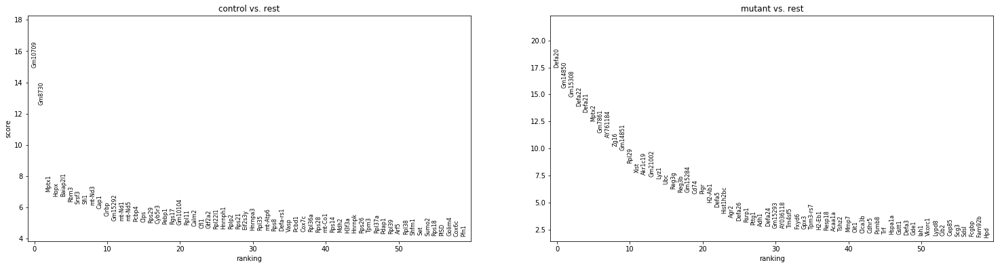

In [70]:
for typo in a_sub.obs['proma_cell_type'].cat.categories:
    print(typo)
    tmp_data = a_sub[a_sub.obs['proma_cell_type']==typo,]
    sc.tl.rank_genes_groups(adata=tmp_data, groupby='genetics', method='wilcoxon', only_positive=True)
    rcParams['figure.figsize']=(13,6)
    sc.pl.rank_genes_groups(adata=tmp_data, n_genes=60)